# **Importing Packages**

Make sure to install the packages before importing if needed.

In [49]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import igraph
import leidenalg
import gseapy as gp
import os
import glob
import re

# **Loading Data**

To see requirements for all AnnData objects (CELLxCELL): https://github.com/chanzuckerberg/single-cell-curation/blob/main/schema/7.0.0/schema.md.

In [50]:
## Emplacement pour elodie 
adata = sc.read_h5ad("/Users/elodiehusson/Desktop/AD & PD/77k_AD_PD_CTRL.h5ad")
## Path Yara 
# adata = sc.read_h5ad("C:/Users/yarad/Desktop/x/Masters/Master BMC - Sorbonne/M2/Single Cell/Project/Coding Project/77k_AD_PD_CTRL.h5ad")

# ajoutez vos emplacements ici du fichier, et juste mettez en commentaires les autres
# adata = sc.read_h5ad(".../.../subset_AD_PD_CTRL.h5ad")

adata_raw = adata.copy()

In [51]:
adata.var_keys

<bound method AnnData.var_keys of AnnData object with n_obs × n_vars = 77052 × 34176
    obs: 'Source', 'n_genes', 'n_counts', 'class', 'subclass', 'subtype', 'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'donor_id', 'suspension_type', 'is_primary_data', 'AD_status', 'DLBD_status', 'FTD_status', 'Tauopathy_status', 'Vascular_status', 'ASCVD_status', 'Schizophrenia', 'Bipolar_Disorder', 'Parkinson_disease', 'Tardive_dyskinesia', 'genetic_ancestry', 'disease_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_name', 'n_cells', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'batch_condition', 'citation', 'class_colors', 'genome', 'organism', 'organism_ontology_t

The studied conditions are the following:

In [42]:
x = adata.obs.groupby(["disease", "AD_status", "Parkinson_disease"]).size()

/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_34276/385958126.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  x = adata.obs.groupby(["disease", "AD_status", "Parkinson_disease"]).size()


## **Reduced Dataset's Metadata**

scanpy shows a structured summary:

In [43]:
adata

AnnData object with n_obs × n_vars = 77052 × 34176
    obs: 'Source', 'n_genes', 'n_counts', 'class', 'subclass', 'subtype', 'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'donor_id', 'suspension_type', 'is_primary_data', 'AD_status', 'DLBD_status', 'FTD_status', 'Tauopathy_status', 'Vascular_status', 'ASCVD_status', 'Schizophrenia', 'Bipolar_Disorder', 'Parkinson_disease', 'Tardive_dyskinesia', 'genetic_ancestry', 'disease_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_name', 'n_cells', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'batch_condition', 'citation', 'class_colors', 'genome', 'organism', 'organism_ontology_term_id', 'schema_reference', 'sche

In [44]:
# This is the sparse matrix
print("adata.X type is :",type(adata.X))

print(adata.X[:5, :5])

adata.X type is : <class 'scipy.sparse._csr.csr_matrix'>
<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 3 stored elements and shape (5, 5)>
  Coords	Values
  (0, 2)	1.0
  (4, 2)	3.0
  (4, 4)	1.0


In [45]:
print(f"The variable adata has the following shape: {adata.shape}.")
print(f"There are {adata.shape[0]} cells and {adata.shape[1]} genes in this dataset.")

The variable adata has the following shape: (77052, 34176).
There are 77052 cells and 34176 genes in this dataset.


In [46]:
donors_per_disease = pd.crosstab(adata.obs["donor_id"],adata.obs["disease"])
donors_per_disease_summary = donors_per_disease.sum()

print("Number of donors per disease status:")
print(donors_per_disease_summary)

Number of donors per disease status:
disease
dementia || Alzheimer disease    31949
dementia || Parkinson disease     7772
normal                           37331
dtype: int64


In [47]:
print("The keys of adata.obs are the following:", adata.obs.keys())

adata.obs.head()

The keys of adata.obs are the following: Index(['Source', 'n_genes', 'n_counts', 'class', 'subclass', 'subtype',
       'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id',
       'cell_type_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'donor_id', 'suspension_type', 'is_primary_data', 'AD_status',
       'DLBD_status', 'FTD_status', 'Tauopathy_status', 'Vascular_status',
       'ASCVD_status', 'Schizophrenia', 'Bipolar_Disorder',
       'Parkinson_disease', 'Tardive_dyskinesia', 'genetic_ancestry',
       'disease_ontology_term_id', 'cell_type', 'assay', 'disease', 'sex',
       'tissue', 'self_reported_ethnicity', 'development_stage',
       'observation_joinid'],
      dtype='object')


,Source,n_genes,n_counts,class,subclass,subtype,tissue_ontology_term_id,tissue_type,assay_ontology_term_id,cell_type_ontology_term_id,...,genetic_ancestry,disease_ontology_term_id,cell_type,assay,disease,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid
barcodekey,,,,,,,,,,,,,,,,,,,,,
Donor_333-1-GTCTGTCGTTCTCCTG-1,R,3117,6236.0,Oligo,Oligo,Oligo_OPALIN,UBERON:0009834,tissue,EFO:0009922,CL:0000128,...,East Asian,MONDO:0001627 || MONDO:0004975,oligodendrocyte,10x 3' v3,dementia || Alzheimer disease,male,dorsolateral prefrontal cortex,unknown,89-year-old stage,O9)|N(dW>u
Donor_1001-1-ACTTTGTGTTACCGTA-1,R,1026,1444.0,Astro,Astro,Astro_WIF1,UBERON:0009834,tissue,EFO:0009922,CL:0000127,...,Asian,MONDO:0001627 || MONDO:0004975,astrocyte,10x 3' v3,dementia || Alzheimer disease,male,dorsolateral prefrontal cortex,unknown,80 year-old and over stage,->kS=j16+~
Donor_638-1-ACCCTTGTCCTTTAGT-0,R,3025,6086.0,Endo,Endo,Endo_IL1R1,UBERON:0009834,tissue,EFO:0009922,CL:0000115,...,East Asian,MONDO:0001627 || MONDO:0004975,endothelial cell,10x 3' v3,dementia || Alzheimer disease,female,dorsolateral prefrontal cortex,unknown,87-year-old stage,K|}`2WPbB3
Donor_865-1-TGTGAGTAGAAAGTCT-0,R,3142,6582.0,Astro,Astro,Astro_PLSCR1,UBERON:0009834,tissue,EFO:0009922,CL:0000127,...,East Asian,MONDO:0001627 || MONDO:0004975,astrocyte,10x 3' v3,dementia || Alzheimer disease,male,dorsolateral prefrontal cortex,unknown,69-year-old stage,G$~mj>Qr*j
Donor_865-1-AGATGCTAGTCTTCCC-0,R,6149,27425.0,IN,IN_SST,IN_SST_EDNRA,UBERON:0009834,tissue,EFO:0009922,CL:4023017,...,East Asian,MONDO:0001627 || MONDO:0004975,sst GABAergic cortical interneuron,10x 3' v3,dementia || Alzheimer disease,male,dorsolateral prefrontal cortex,unknown,69-year-old stage,;NJWoHZNH+


In [48]:
print("Donor Names : \n", adata.obs_names)

print("Gene Names : \n", adata.var_names) # These are Ensembl IDs

Donor Names : 
 Index(['Donor_333-1-GTCTGTCGTTCTCCTG-1', 'Donor_1001-1-ACTTTGTGTTACCGTA-1',
       'Donor_638-1-ACCCTTGTCCTTTAGT-0', 'Donor_865-1-TGTGAGTAGAAAGTCT-0',
       'Donor_865-1-AGATGCTAGTCTTCCC-0', 'Donor_1007-1-GCCCAGATCAAAGACA-0',
       'Donor_865-2-GTAGAAAAGAATTGTG-1', 'Donor_1001-1-TTGTTCACACGCACCA-1',
       'Donor_638-2-CTTTCGGAGAAACTAC-1', 'Donor_31-1-GGGACTCAGGTAGTAT-0',
       ...
       'Donor_721-1-TTGGGCGAGATGACCG-0', 'Donor_634-2-CAGATCATCACTCCGT-0',
       'Donor_735-2-AGATGCTCAAGTGACG-1', 'Donor_1278-1-GACCAATTCTCGTCAC-0',
       'Donor_634-2-TACCTGCCAGAGTAAT-0', 'Donor_735-1-CCTCTCCAGCAACCAG-0',
       'Donor_1278-1-CATTCCGCAGCTGTCG-0', 'Donor_721-2-CACTTCGGTAGTCTGT-1',
       'Donor_634-2-ACGATCATCATGAAAG-0', 'Donor_721-1-AAGCGAGCAGCGTACC-0'],
      dtype='object', name='barcodekey', length=77052)
Gene Names : 
 Index(['ENSG00000000003', 'ENSG00000000005', 'ENSG00000000419',
       'ENSG00000000457', 'ENSG00000000460', 'ENSG00000000938',
       'ENSG00000000

In [49]:
disease_list = list(adata.obs["disease"].cat.categories)

print("The types of disease in this dataset are :", disease_list)

The types of disease in this dataset are : ['dementia || Alzheimer disease', 'dementia || Parkinson disease', 'normal']


The number of cells per disease type in this dataset:

In [50]:
for disease_type in disease_list : 

    print(len(adata.obs["disease"][adata.obs["disease"] == disease_type]), " cells :", disease_type)

31949  cells : dementia || Alzheimer disease
7772  cells : dementia || Parkinson disease
37331  cells : normal


Gene metadata:

In [51]:
print("adata.var.keys :", adata.var.keys())

print("First 5 rows from adata.var:")
print(adata.var.head(5))

adata.var.keys : Index(['gene_name', 'n_cells', 'feature_is_filtered', 'feature_name',
       'feature_reference', 'feature_biotype', 'feature_length',
       'feature_type'],
      dtype='object')
First 5 rows from adata.var:
                gene_name  n_cells  feature_is_filtered feature_name  \
ENSG00000000003    TSPAN6   256237                False       TSPAN6   
ENSG00000000005      TNMD    21369                False         TNMD   
ENSG00000000419      DPM1  3001206                False         DPM1   
ENSG00000000457     SCYL3  1941205                False        SCYL3   
ENSG00000000460  C1orf112  1798664                False        FIRRM   

                feature_reference feature_biotype feature_length  \
ENSG00000000003    NCBITaxon:9606            gene           2396   
ENSG00000000005    NCBITaxon:9606            gene            873   
ENSG00000000419    NCBITaxon:9606            gene           1262   
ENSG00000000457    NCBITaxon:9606            gene           2916   


#### **Existing Embeddings**
It would be interesting and informative to compare existing embeddings to our results.

In [52]:
# Embeddings (UMAP, PCA...)
print("adata.obsm.keys :", adata.obsm.keys())

# Other information
print("adata.uns.keys :", adata.uns.keys())

adata.obsm.keys : KeysView(AxisArrays with keys: X_umap)
adata.uns.keys : dict_keys(['batch_condition', 'citation', 'class_colors', 'genome', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'subclass_colors', 'subtype_colors', 'title', 'uid'])


Based on the existing UMAPs, there does not seem to be a batch effect in our data. Remove the # to view the corresponding UMAP:

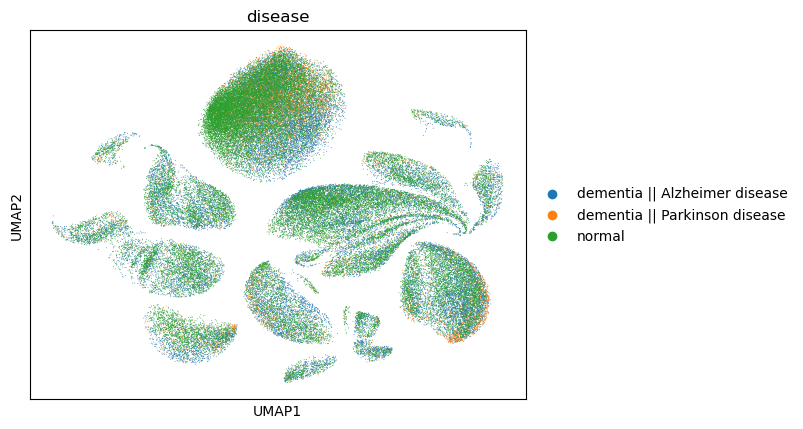

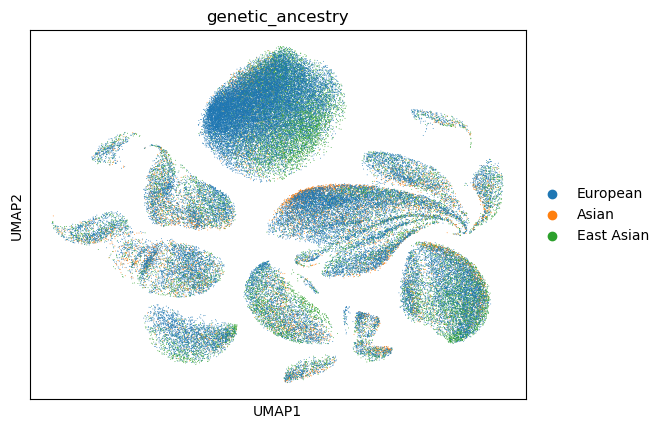

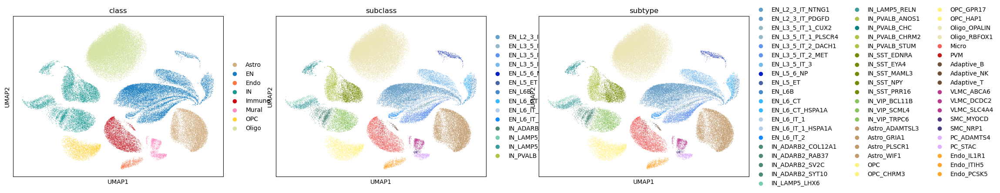

In [53]:
# sc.pl.umap(adata, color = 'cell_type')
sc.pl.umap(adata, color = 'disease')
sc.pl.umap(adata, color = 'genetic_ancestry')

# sc.pl.umap(adata, color = 'AD_status')
# sc.pl.umap(adata, color = 'sex')
# sc.pl.umap(adata, color = 'subclass')
# sc.pl.umap(adata, color = ['cell_type', 'subclass'])
sc.pl.umap(adata, color = ['class', 'subclass', 'subtype'])

In [54]:
del adata.obsm["X_umap"]

# **RNAseq pipeline**

## 1. Quality Check

### a - Visualization of QC metrics

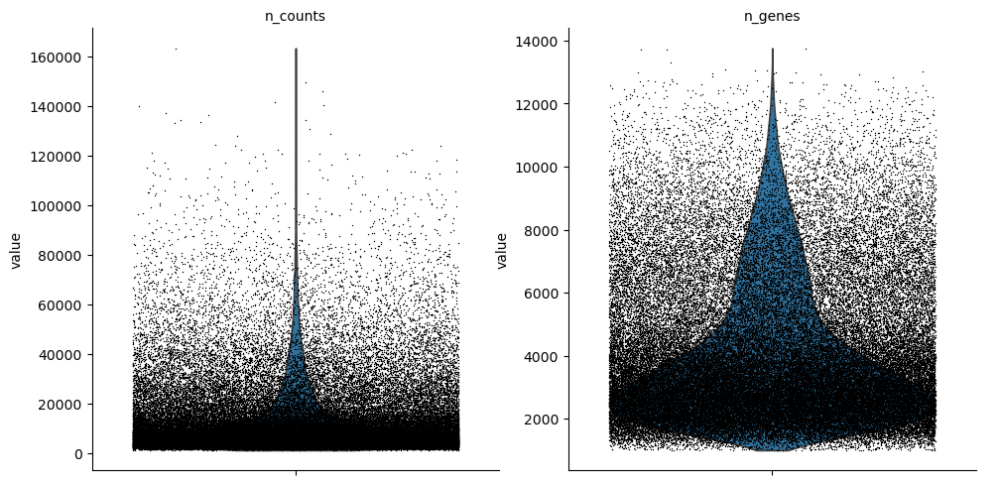

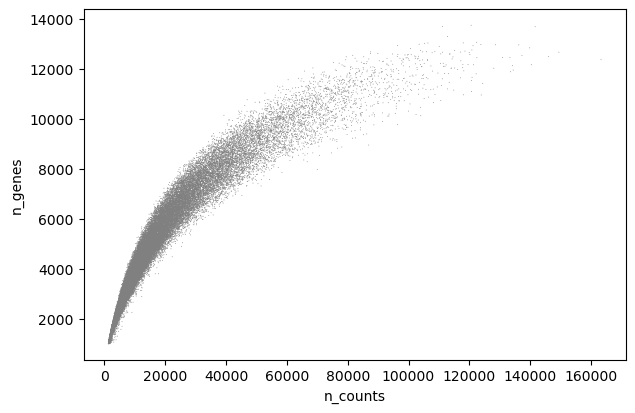

In [55]:
# 1. Calculation of QC metrics and addition to adata.obs
sc.pp.calculate_qc_metrics(adata, inplace = True)

# 2. Visualization of QC metrics before filtering
sc.pl.violin(
    adata, 
    ['n_counts', 'n_genes'], # Violin plot of number of genes and counts per cell
    jitter = 0.4,
    multi_panel = True
)

sc.pl.scatter(adata, x = 'n_counts', y = 'n_genes') # Scatter plot of number of genes vs. number of counts

### b - Filtering out low quality cells

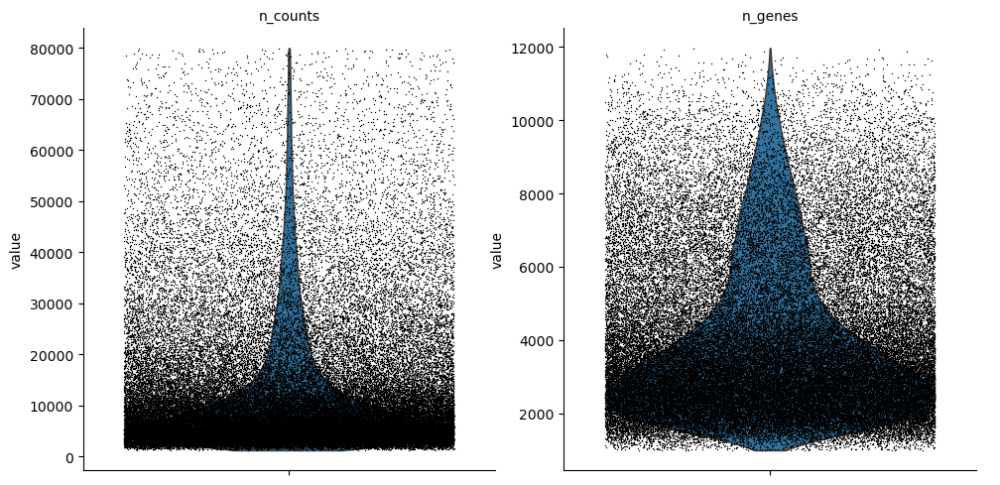

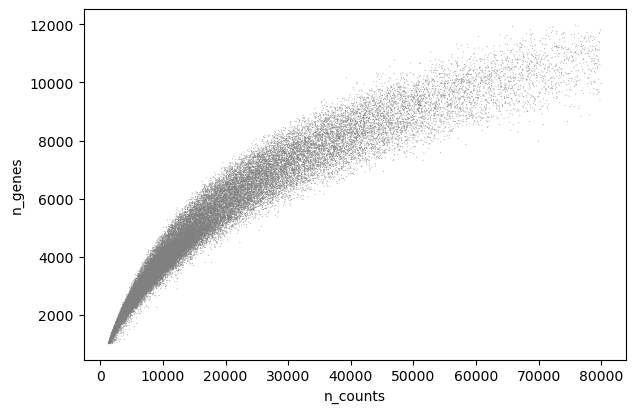

In [56]:
# 3. Application of filters
adata = adata[adata.obs['n_genes'] < 12000, :] # cutoff chosen: 12 000 genes

adata = adata[adata.obs['n_counts'] < 80000, :] # cutoff chosen: 80 000 counts

# 4. Visualization of QC metrics after filtering
sc.pl.violin(
    adata, 
    ['n_counts', 'n_genes'], # violin plot of number of genes and counts per cell
    jitter = 0.4,
    multi_panel = True
)

sc.pl.scatter(adata, x = 'n_counts', y = 'n_genes') # Scatter plot of number of genes vs. number of counts

### c - Filtering out mitochondrial genes

In [57]:
# Counting the number of mitochondrial genes
adata.var["mt"] = adata.var['gene_name'].str.startswith("MT-")

# Calculating QC metrics including the percentage of mitochondrial genes and adding them to adata.obs
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars = ["mt"],
    inplace = True,
    log1p = True
)

/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_34276/4025084783.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var['gene_name'].str.startswith("MT-")


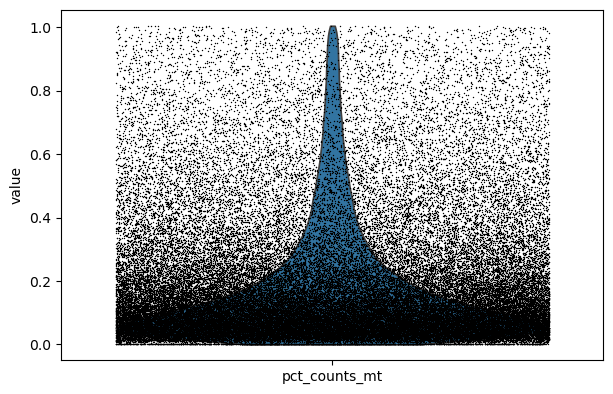

In [58]:
# Visualization of the percentage of mitochondrial genes
sc.pl.violin(
    adata,
    keys='pct_counts_mt',
    jitter = 0.4,
    rotation=  0,   
    stripplot = True,
    show = True
)

# data was already filtered on pct_counts_mt 
# it's weird because even before the filtering there was no cell with >10%. 
# They must have been filtered before
# I still keep the line just in case
# Filtering cells with more than 10% mitochondrial gene expression
adata_hvgadata = adata[adata.obs['pct_counts_mt'] < 10, :]


Here, we note that there were no cells with more than 10% mitochondrial gene expression in the dataset even before we applied our own filter. This means that the dataset did not contain such cells, either because of the nature of the data or because the dataset was already treated and filtered.

### d - Excluding ribosomal and hemoglobin genes
We will be keeping ribosomal genes, which make up 1.5% of genes expressed, and filtering out hemoglobin genes.

In [59]:
# Ribosomal genes
adata.var["ribo"] = adata.var['gene_name'].str.startswith(("RPS", "RPL"))
print("proportion of ribo genes in all expressed genes : ", adata.var["ribo"].sum()/len(adata.var)*100)

# Hemoglobin genes
adata.var["hb"] = adata.var['gene_name'].str.contains("^HB[^(P)]")
print("Number of hemo genes before deletion : ", adata.var["hb"].sum())

# Confirming that hb genes were properly removed
genes_to_keep = ~adata.var["hb"]
adata = adata[:, genes_to_keep].copy()
print("Number of hemo genes after deletion: ", adata.var["hb"].sum())

proportion of ribo genes in all expressed genes :  1.5127574906367043
Number of hemo genes before deletion :  9
Number of hemo genes after deletion:  0


### e - important : apply the filtering on adata_raw

In [60]:
adata_raw = adata_raw[adata.obs_names, adata.var_names].copy() 

## 2. Normalization

The dataset is in raw counts

In [61]:
from scipy import sparse

# we can see that this is a sparse matrix, without normalized values
adata.X[:5, :10].toarray()

array([[0., 0., 1., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 4., 1., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 3., 0., 1., 0., 0., 0., 2., 0.]], dtype=float32)

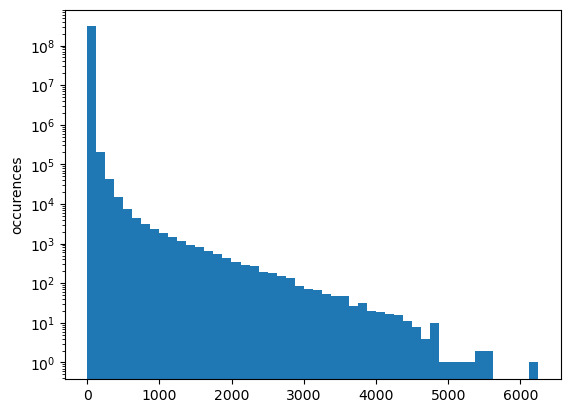

In [62]:
plt.hist(adata.X.data, bins=50, log = True)
plt.ylabel("occurences")
plt.show()

Normalization using log1p

In [63]:
sc.pp.log1p(adata)

## 3. Highly Variable Genes (HVGs)

we kept 3000 highly variable genes out of 34167 genes


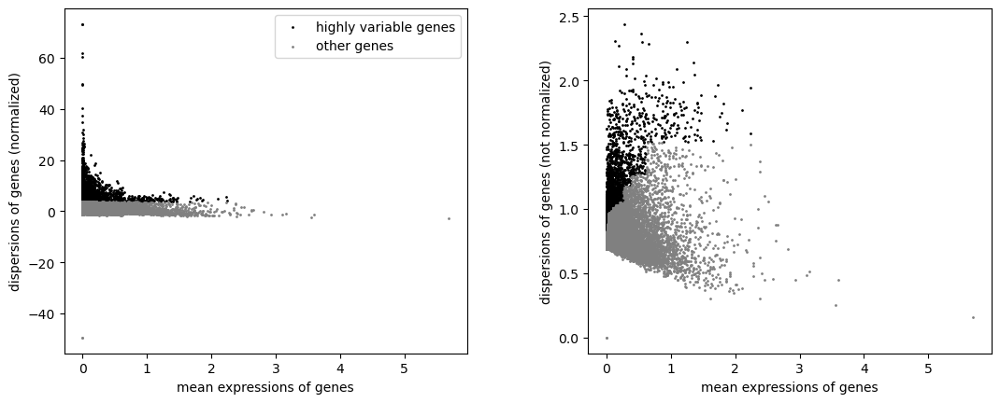

In [64]:
nHVG = 3000 

sc.pp.highly_variable_genes(
    adata, 
    flavor='cell_ranger',
    n_top_genes=nHVG
)

print("we kept", nHVG, "highly variable genes out of", adata.shape[1], "genes")
sc.pl.highly_variable_genes(adata)

In [65]:
adata.var['highly_variable'].value_counts()

highly_variable
False    31167
True      3000
Name: count, dtype: int64

new AnnData object with the HVG only

In [66]:
adata_hvg = adata[:, adata.var['highly_variable']].copy()

## 4. Scaling & PCA

In [67]:
# Scaling (3s)
sc.pp.scale(adata_hvg, max_value = 10)

/opt/anaconda3/envs/scanpy310/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [68]:
# PCA (1min30)
sc.tl.pca(adata_hvg)

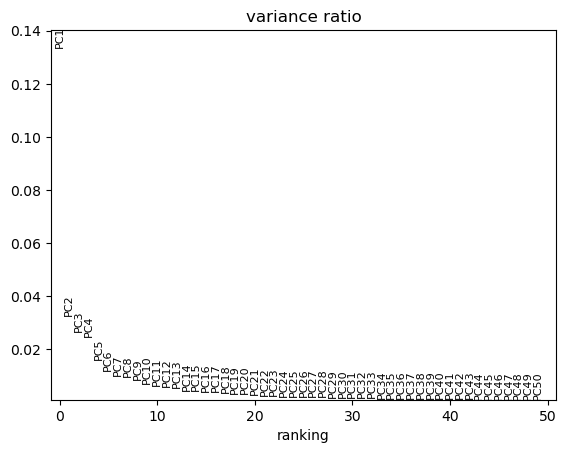

In [69]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs = 50) # elbow plot to see how many PCs to keep

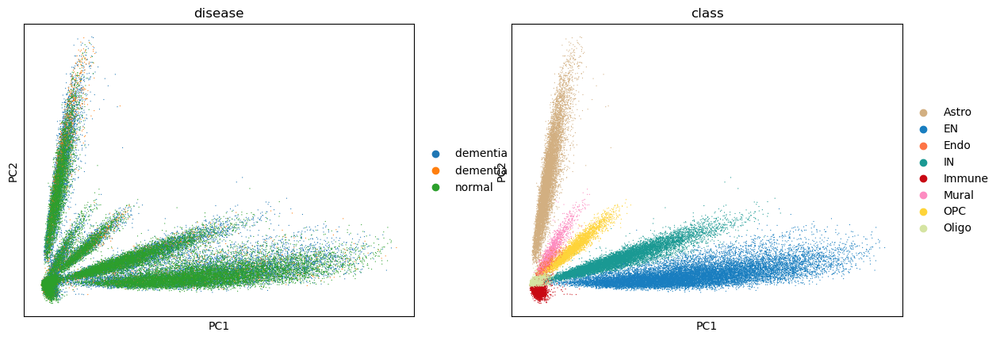

In [70]:
sc.pl.pca(
    adata_hvg,
    color = ["disease", "class"],
    ncols = 3,
    size = 3)

## 5. Batch effect correction

In [ ]:
# 37 sec
import bbknn
# bbknn.bbknn(adata_hvg, batch_key='donor_id')
sc.external.pp.bbknn(adata_hvg, batch_key="donor_id")

/opt/anaconda3/envs/scanpy310/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 6. Clustering

In [ ]:
adata_hvg.obs["class"].value_counts()

class
Oligo     29919
EN        17717
IN        10258
Astro      9235
Immune     4270
OPC        3085
Mural      1348
Endo        740
Name: count, dtype: int64

In [ ]:
donors_by_class_and_subclass = (adata_hvg.obs.groupby(["class", "subclass"], observed=True)["donor_id"].nunique())
donors_by_class_and_subclass

class   subclass     
Astro   Astro            17
EN      EN_L2_3_IT       17
        EN_L3_5_IT_1     17
        EN_L3_5_IT_2     17
        EN_L3_5_IT_3     17
        EN_L5_6_NP       16
        EN_L5_ET          5
        EN_L6B           16
        EN_L6_CT         16
        EN_L6_IT_1       16
        EN_L6_IT_2       15
Endo    Endo             17
IN      IN_ADARB2        17
        IN_LAMP5_LHX6    17
        IN_LAMP5_RELN    17
        IN_PVALB         17
        IN_PVALB_CHC     17
        IN_SST           17
        IN_VIP           17
Immune  Micro            17
        PVM              16
        Adaptive         12
Mural   VLMC             16
        SMC              13
        PC               17
OPC     OPC              17
Oligo   Oligo            17
Name: donor_id, dtype: int64

### Neighbors

In [ ]:
# 25 sec
# number of neighbors
# we chose 30 PCs because after that the variance ratio doesn't decrease that much
nPC = 30

sc.pp.neighbors(
    adata_hvg,
    n_neighbors=30,      # plus grand → structure plus globale, moins de petits fragments
    n_pcs=nPC,            # tu peux monter à 40–50 si tu veux
    metric="euclidean",
    random_state=42,
)

### Clustering

In [ ]:
#import igraph
#import leidenalg

sc.tl.leiden(adata_hvg, resolution = 0.02)

print("Number of clusters :", len(adata_hvg.obs['leiden'].cat.categories))

Number of clusters : 10


### UMAP

In [ ]:
# 2 min 46
sc.tl.umap(
    adata_hvg,
    min_dist=0.8,        # 0.8 au lieu de 0.5 → clusters un peu plus serrés
    random_state=40,
)

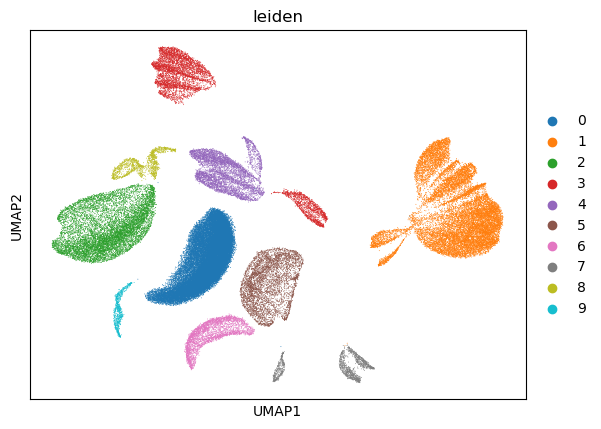

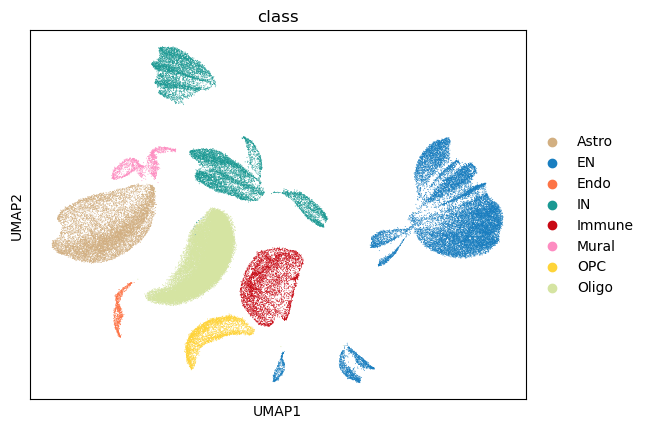

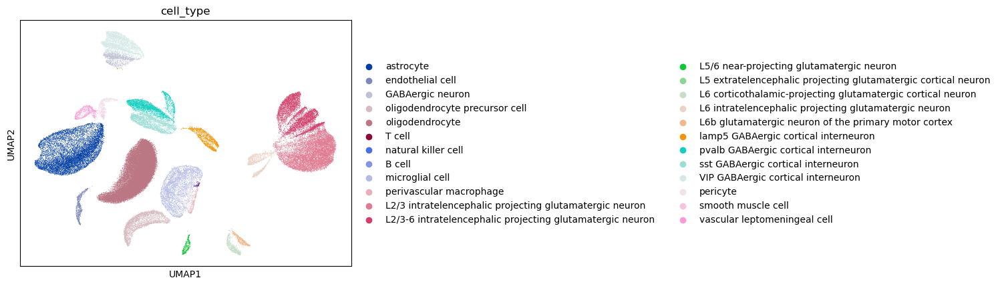

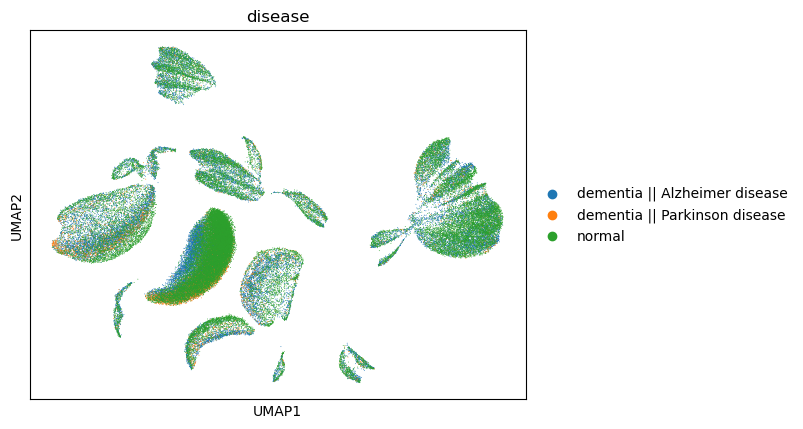

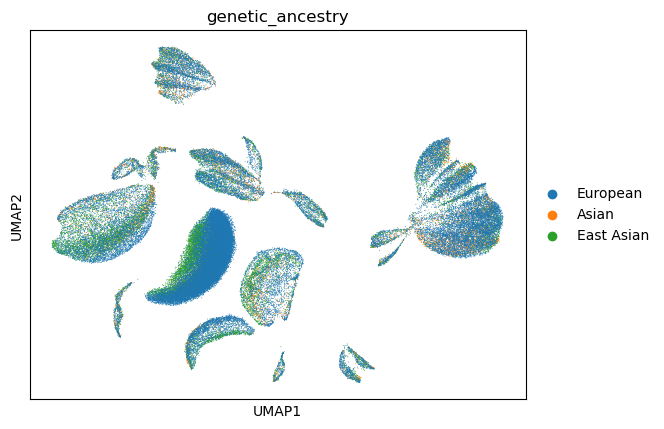

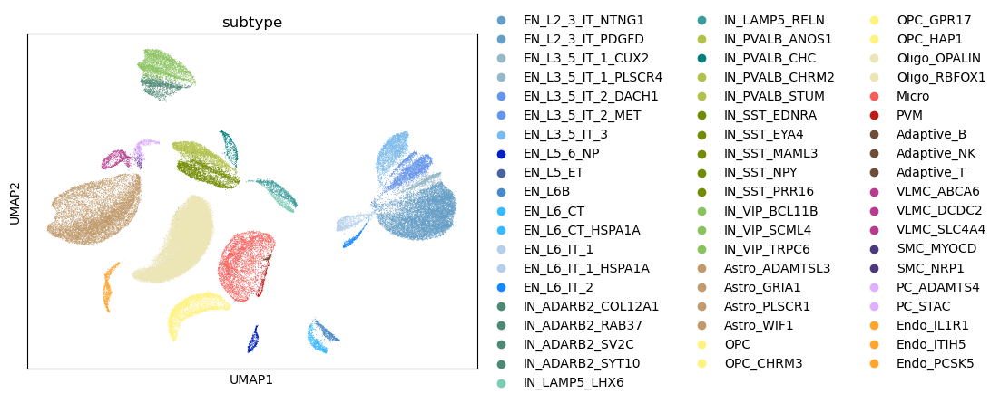

In [ ]:

sc.pl.umap(adata_hvg, color="leiden")

sc.pl.umap(adata_hvg, color="class")

sc.pl.umap(adata_hvg, color='cell_type')

sc.pl.umap(adata_hvg, color="disease")
sc.pl.umap(adata_hvg, color="genetic_ancestry")

sc.pl.umap(adata_hvg, color='subtype')

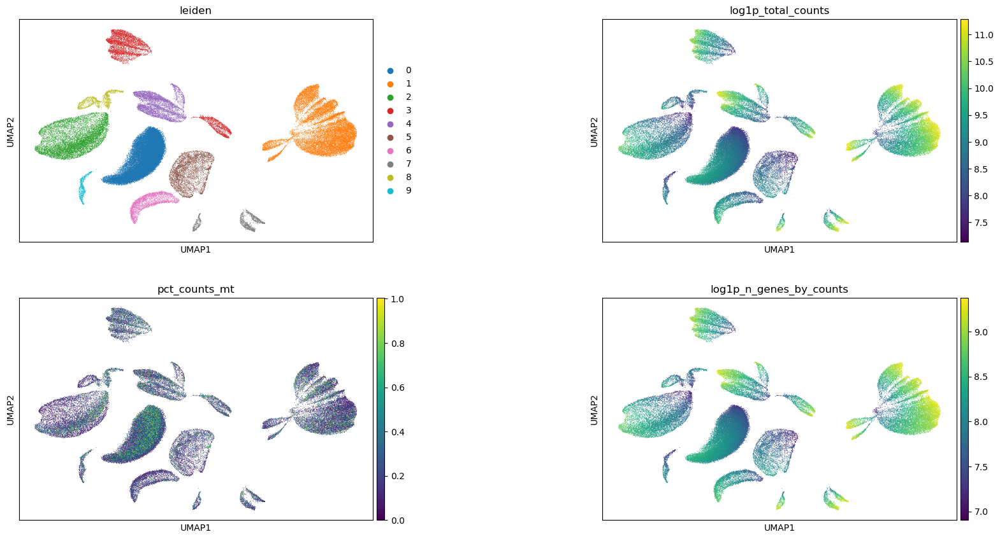

In [ ]:
sc.pl.umap(
    adata_hvg,
    color = ["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace = 0.5,
    ncols = 2,
)

## 7. Manual Annotation

#### Marker gene set
We first define known marker genes of the cell types that we think are represented by the clusters. We only keep the genes in that list that are found in our data.

In [ ]:
# Define marker genes for each cell type
marker_genes = {
    "Astrocytes" : ["ENSG00000135821", "ENSG00000125398", "ENSG00000171885", "ENSG00000152661", "ENSG00000165795", "ENSG00000131095", "ENSG00000144908"],
    "Endothelial cells" : ["ENSG00000184113", "ENSG00000229515"],
    "Immune cells" : ["ENSG00000125730", "ENSG00000019582" ,"ENSG00000168329","ENSG00000182578", "ENSG00000173372"],
    "Oligodendrocytes" : ["ENSG00000197971", "ENSG00000204655", "ENSG00000123560", "ENSG00000168314", "ENSG00000105695", "ENSG00000172270","ENSG00000204351", "ENSG00000087086",  "ENSG00000115310",  "ENSG00000140076",  "ENSG00000205927", "ENSG00000100146"],
    "OPC" : ["ENSG00000184221", "ENSG00000205927", "ENSG00000150275", "ENSG00000134853"],
    "Excitatory Neurons" : ["ENSG00000070808", "ENSG00000154146", "ENSG00000119042", "ENSG00000104888"],
    "Inhibitory Neurons" : ["ENSG00000128683", "ENSG00000136750"],
    "Mural" : ["ENSG00000113721", "ENSG00000175084", "ENSG00000173546", 'ENSG00000168826', "ENSG00000074181" ]
    }

marker_genes

# Only keep the marker genes find in our data

marker_genes_in_data = {}
for ct, markers in marker_genes.items():
    markers_found = []
    for marker in markers:
        if marker in adata_hvg.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

marker_genes_in_data
 

{'Astrocytes': ['ENSG00000171885',
  'ENSG00000152661',
  'ENSG00000131095',
  'ENSG00000144908'],
 'Endothelial cells': ['ENSG00000184113'],
 'Immune cells': ['ENSG00000125730',
  'ENSG00000019582',
  'ENSG00000168329',
  'ENSG00000182578'],
 'Oligodendrocytes': [],
 'OPC': ['ENSG00000150275', 'ENSG00000134853'],
 'Excitatory Neurons': ['ENSG00000119042'],
 'Inhibitory Neurons': ['ENSG00000128683', 'ENSG00000136750'],
 'Mural': ['ENSG00000074181']}

Listing cell types we want to show the markers for:

In [ ]:
cell_types = ["Astrocytes", "Endothelial cells", "Immune cells", "Oligodendrocytes", "OPC", "Excitatory Neurons", "Inhibitory Neurons", "Mural"]
cell_types

['Astrocytes',
 'Endothelial cells',
 'Immune cells',
 'Oligodendrocytes',
 'OPC',
 'Excitatory Neurons',
 'Inhibitory Neurons',
 'Mural']

Plotting one UMAP per marker for each cell type:

ASTROCYTES:


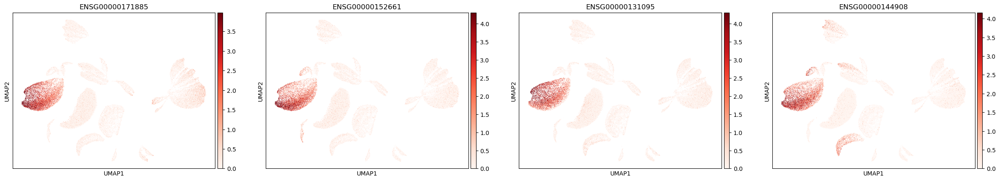





ENDOTHELIAL CELLS:


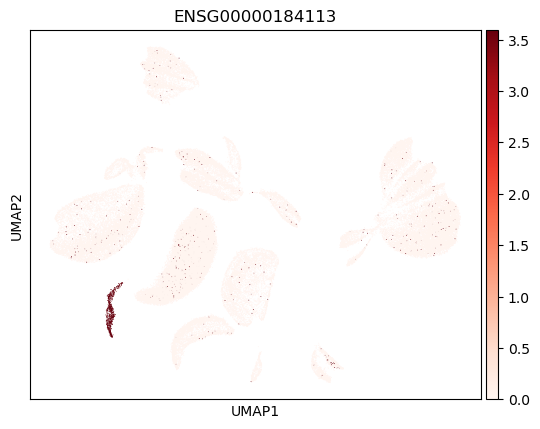





IMMUNE CELLS:


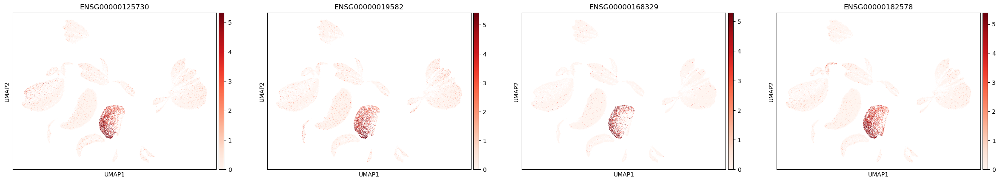





OLIGODENDROCYTES: No marker genes found in data.

OPC:


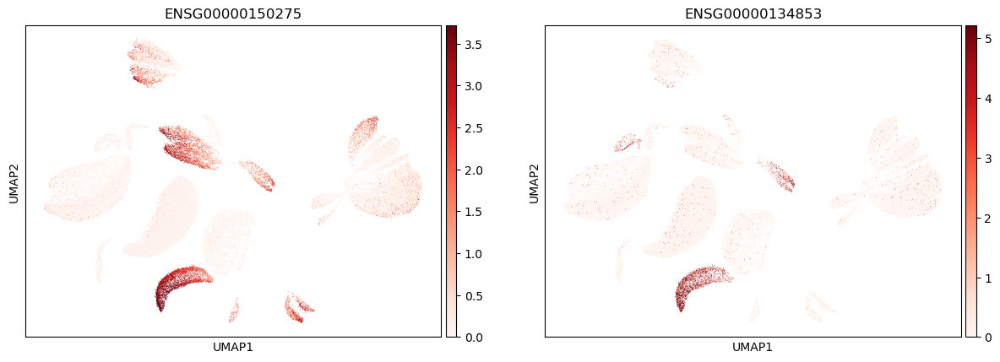





EXCITATORY NEURONS:


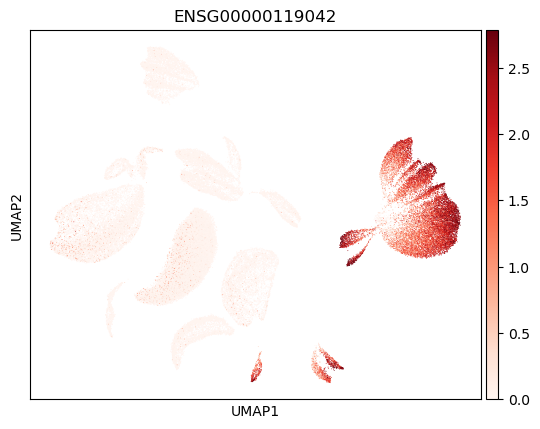





INHIBITORY NEURONS:


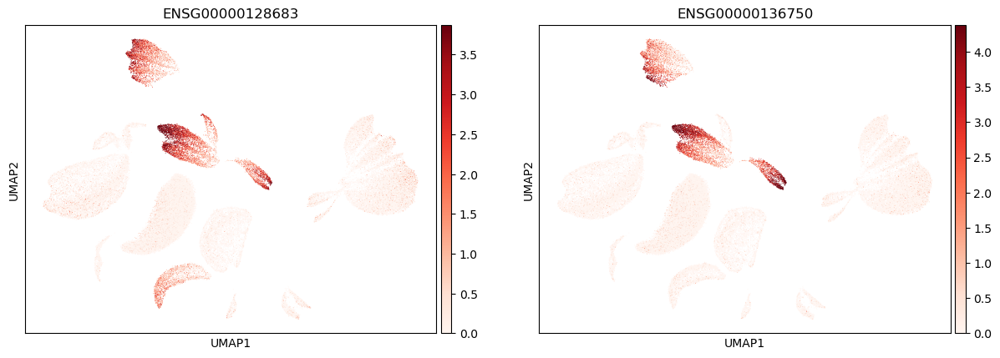





MURAL:


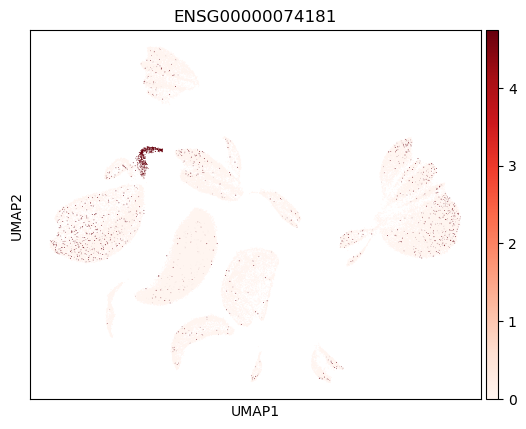

In [ ]:
for ct in cell_types:
    markers = marker_genes_in_data[ct]
    if not markers:  # Skip if the list is empty
        print(f"{ct.upper()}: No marker genes found in data.\n")
        continue
    
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata_hvg,
        color = markers,
        vmin = 0,
        vmax = "p99",
        sort_order = False,
        cmap = "Reds",
    )
    
    print("\n\n\n")  # print white space for legibility

Dotplot visualization of marker gene expression per cluster:

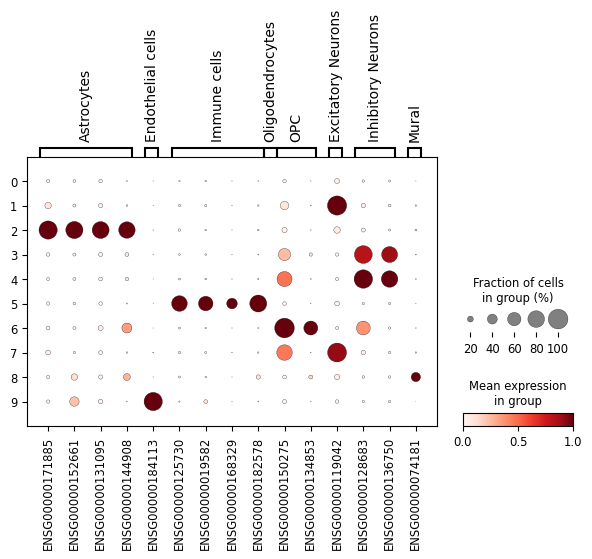

In [ ]:
sc.pl.dotplot(
    adata_hvg,
    groupby = "leiden",
    var_names = marker_genes_in_data,
    standard_scale = "var",  # standard scale: normalize each gene to range from 0 to 1
)

Referring to both representations, we can manually annotate the clusters:

In [ ]:
cl_annotation = {
    "0": "Oligodendrocytes",
    "1": "Excitatory Neurons",
    "2": "Astrocytes", 
    "3": "Inhibitory Neurons",
    "4": "Inhibitory Neurons", 
    "5" : "Immune cells", 
    "6" : "OPC",
    "7" : "Excitatory Neurons",
    "8" : "Mural",
    "9" : "Endothelial cells"
}

To visualize the annotations:

... storing 'manual_celltype_annotation' as categorical


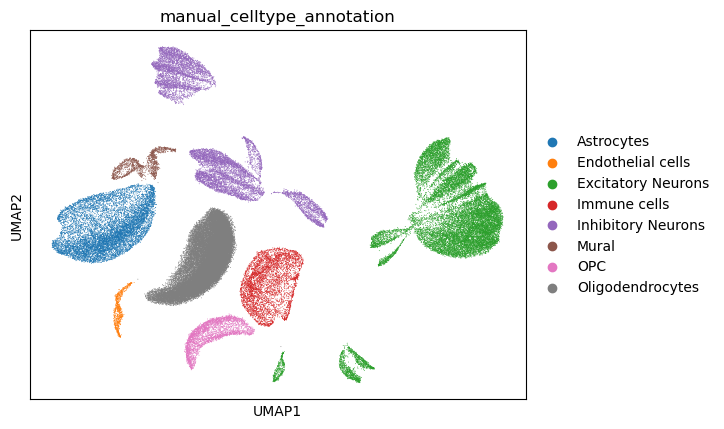

In [ ]:
adata_hvg.obs["manual_celltype_annotation"] = adata_hvg.obs.leiden.map(cl_annotation)

sc.pl.umap(adata_hvg, color = ["manual_celltype_annotation"])

To confirm our annotations, we can find the differentially expressed genes for each cluster as compared to the others. We also want to use this to distinguish clusters 4 and 5.

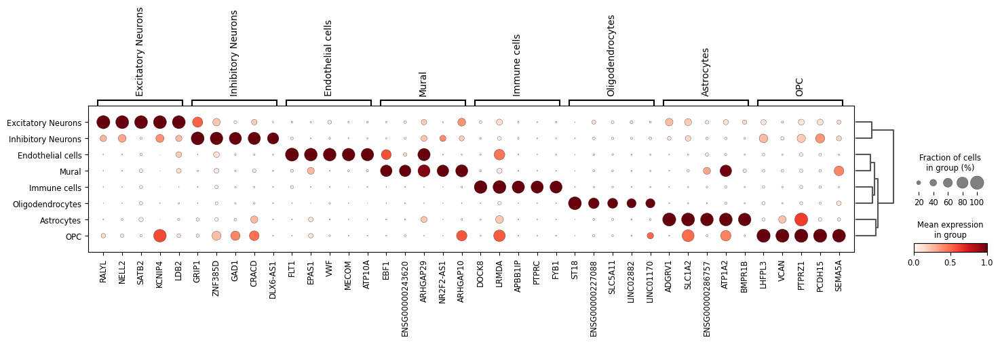

In [ ]:
# Calculating differentially expressed genes for each cluster 
    ## We are using the rank_genes_groups function from scanpy for annotations, but for downstream analyses, we will do pseudo-bulk differential expression to avoid pseudoreplication issues

sc.tl.rank_genes_groups(
    adata_hvg, groupby = "manual_celltype_annotation", method = "wilcoxon", key_added = "dea_leiden", var_names="gene_name"
)

# Visualizing the expression of the 5 top DE genes per cluster (dotplot representation)
sc.pl.rank_genes_groups_dotplot(
    adata_hvg, groupby = "manual_celltype_annotation", standard_scale = "var", n_genes = 5, key = "dea_leiden" , gene_symbols="gene_name"
)

## 8. Differential Gene Expression

### *Pseudobulk*

In [ ]:
x = (adata_raw.obs.groupby([ "disease"], observed=True)["donor_id"].nunique())
print("The number of donor per disease condition :\n",x)
print("\nThe number of cells per disease condition ;")
adata_raw.obs.groupby(["class", "disease"]).size().unstack(fill_value=0)

The number of donor per disease condition :
 disease
dementia || Alzheimer disease    8
dementia || Parkinson disease    3
normal                           6
Name: donor_id, dtype: int64

The number of cells per disease condition ;


disease,dementia || Alzheimer disease,dementia || Parkinson disease,normal
class,,,
Astro,4620,1128,3487
EN,7602,804,9311
Endo,417,39,284
IN,4695,539,5024
Immune,2188,383,1699
Mural,684,69,595
OPC,1256,323,1506
Oligo,10242,4461,15216


pseudo-bulk matrix (=pb) : 

- lines : cell type per donor 
- columns : mean expression levels

each donor is an indepedant observation. We cannot compare each cell one by one because it's statistically false. We do a pseudo-bulk donor x cell type.

Each value corresponds to the mean log-normalized of 1 donor for 1 cell type

In [ ]:
# Creation of dataframe for pseudobulk
df = adata_raw.to_df()  # 
meta = adata_raw.obs[["donor_id", "class", "disease"]]

df["donor_id"] = meta["donor_id"].values
df["class"] = meta["class"].values
df["disease"] = meta["disease"].values

pb = (df.groupby(["class", "donor_id", "disease"]).sum()) # sum of n_counts per class, donor and disease
pb = pb[pb.sum(axis=1) != 0] # deleting empty lines
pb = pb.reset_index()

# check if the dataframe is of correct shape
if pb.shape[0] == len((adata.obs["donor_id"].cat.categories))* len((adata.obs["class"].cat.categories)) and pb.shape[1] == len(adata_raw.var)+3 :
    print("Dataframe IS OK : no donor or gene were deleted")
else : 
    print("WARNING : wrong number of donors")
pb

Dataframe IS OK : no donor or gene were deleted


,class,donor_id,disease,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,...,ENSG00000288600,ENSG00000288602,ENSG00000288605,ENSG00000288606,ENSG00000288611,ENSG00000288612,ENSG00000288622,ENSG00000288637,ENSG00000288642,ENSG00000288643
0,Astro,Donor_31,dementia || Alzheimer disease,71.0,7.0,242.0,173.0,139.0,1.0,4.0,...,0.0,98.0,37.0,6.0,0.0,21.0,4.0,3.0,15.0,13.0
1,Astro,Donor_228,dementia || Alzheimer disease,63.0,1.0,258.0,197.0,123.0,2.0,1.0,...,1.0,119.0,25.0,10.0,1.0,30.0,3.0,5.0,10.0,17.0
2,Astro,Donor_333,dementia || Alzheimer disease,110.0,12.0,140.0,102.0,101.0,1.0,5.0,...,0.0,69.0,13.0,7.0,1.0,18.0,1.0,3.0,39.0,16.0
3,Astro,Donor_545,dementia || Parkinson disease,19.0,3.0,154.0,112.0,69.0,1.0,1.0,...,0.0,91.0,21.0,7.0,1.0,19.0,2.0,6.0,13.0,18.0
4,Astro,Donor_609,normal,60.0,6.0,245.0,156.0,106.0,2.0,8.0,...,0.0,121.0,13.0,12.0,1.0,27.0,0.0,3.0,31.0,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,Oligo,Donor_1001,dementia || Alzheimer disease,5.0,0.0,293.0,204.0,266.0,6.0,18.0,...,0.0,164.0,3.0,50.0,1.0,38.0,4.0,34.0,83.0,29.0
132,Oligo,Donor_1007,dementia || Alzheimer disease,0.0,0.0,15.0,11.0,15.0,0.0,1.0,...,0.0,4.0,0.0,4.0,0.0,3.0,0.0,4.0,4.0,2.0
133,Oligo,Donor_1146,normal,10.0,0.0,319.0,213.0,165.0,4.0,7.0,...,0.0,85.0,3.0,31.0,0.0,29.0,3.0,21.0,200.0,38.0
134,Oligo,Donor_1278,normal,8.0,1.0,808.0,516.0,642.0,5.0,30.0,...,2.0,270.0,0.0,74.0,2.0,69.0,1.0,78.0,233.0,118.0


In [ ]:
# saving the pseudobulk matrix into csv
pb.to_csv("pseudobulk_matrix.csv", index = False)

### *Differential analysis is done in R*

example of a DE result

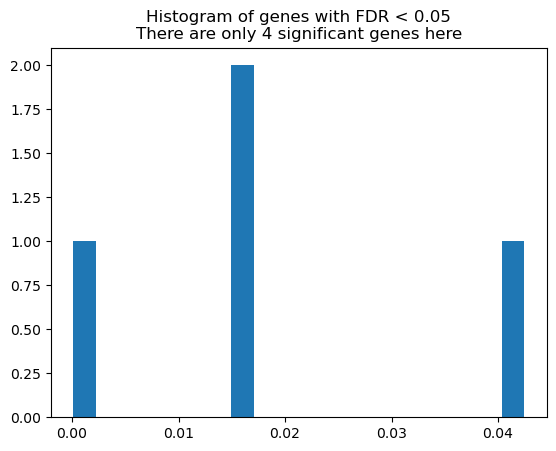

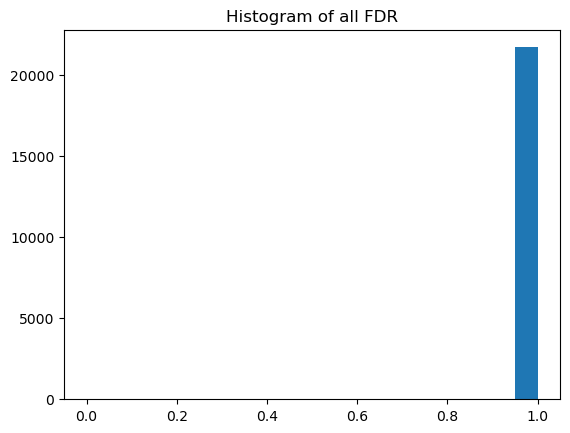

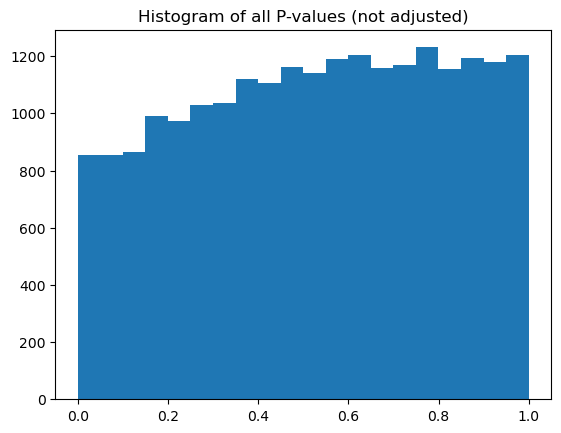

,logFC,logCPM,F,PValue,FDR
ENSG00000026508,-2.192966,1.817744,75.958392,5.298840e-09,0.000116
ENSG00000259520,-2.348001,2.874461,41.200614,1.394094e-06,0.015099
ENSG00000188393,4.813545,0.349007,33.295073,2.076138e-06,0.015099
ENSG00000225231,4.497031,1.948137,32.146706,7.784117e-06,0.042458


In [ ]:
x = pd.read_csv("edgeR_results/edgeR_IN_AD_vs_CTRL.csv",index_col=0)
plt.hist(x[x["FDR"]< 0.05]["FDR"],bins=20) 
plt.title("Histogram of genes with FDR < 0.05\nThere are only 4 significant genes here")
plt.show()

plt.hist(x["FDR"],bins=20) 
plt.title("Histogram of all FDR")
plt.show()

plt.hist(x["PValue"],bins=20) 
plt.title("Histogram of all P-values (not adjusted)")
plt.show()

x[x["FDR"]<0.05] # every gene where padj < 0.05


# **GSEA**

Loading the DE results:

fonction pour ajouter la colonne de gène et l'ajouter à un fichier qui vient d'être load + rank les gènes avec un -logFC jsp quoi. un ranked signed

In [59]:
#files = glob.glob("edgeR_results/*.csv") #run this if you want to run the mygene chunk

files = [f for f in glob.glob("edgeR_results/*.csv") if "_GENESYMBOL" not in f]
files

['edgeR_results/edgeR_Mural_AD_vs_PD.csv',
 'edgeR_results/edgeR_Immune_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_Endo_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_EN_AD_vs_PD.csv',
 'edgeR_results/edgeR_Immune_AD_vs_PD.csv',
 'edgeR_results/edgeR_Astro_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_Oligo_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_IN_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_OPC_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_Mural_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_EN_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_OPC_AD_vs_PD.csv',
 'edgeR_results/edgeR_Immune_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_Astro_AD_vs_PD.csv',
 'edgeR_results/edgeR_Oligo_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_Oligo_AD_vs_PD.csv',
 'edgeR_results/edgeR_Endo_AD_vs_PD.csv',
 'edgeR_results/edgeR_IN_PD_vs_CTRL.csv',
 'edgeR_results/edgeR_Mural_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_OPC_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_EN_AD_vs_CTRL.csv',
 'edgeR_results/edgeR_IN_AD_vs_PD.csv',
 'edgeR_results/edgeR_Endo_AD_vs_CTRL.csv',
 'edg

In [167]:
import pandas as pd

# Compter cellules par (donor, disease, class)
df = (
    adata.obs
    .groupby(["donor_id", "disease", "class"])
    .size()
    .reset_index(name="n_cells")
)
df = df[df["n_cells"]!=0]
df["disease"] = df["disease"].replace({
    "dementia || Alzheimer disease": "Alzheimer disease",
    "dementia || Parkinson disease": "Parkinson disease",
    "normal": "Control"
})
df

/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/957203659.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["donor_id", "disease", "class"])
/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/957203659.py:11: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df["disease"] = df["disease"].replace({


,donor_id,disease,class,n_cells
0,Donor_31,Alzheimer disease,Astro,430
1,Donor_31,Alzheimer disease,EN,832
2,Donor_31,Alzheimer disease,Endo,1
3,Donor_31,Alzheimer disease,IN,326
4,Donor_31,Alzheimer disease,Immune,345
...,...,...,...,...
395,Donor_1467,Parkinson disease,IN,49
396,Donor_1467,Parkinson disease,Immune,53
397,Donor_1467,Parkinson disease,Mural,16
398,Donor_1467,Parkinson disease,OPC,97


In [168]:

tot = adata.obs.groupby(["donor_id"]).size().reset_index(name="total")

# merge
df = df.merge(tot, on="donor_id")
df["prop"] = df["n_cells"] / df["total"]

/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/1783639050.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tot = adata.obs.groupby(["donor_id"]).size().reset_index(name="total")


In [169]:
list(df["class"].unique())

['Astro', 'EN', 'Endo', 'IN', 'Immune', 'Mural', 'OPC', 'Oligo']

/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/3369405633.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/3369405633.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/3369405633.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/k4/d0pwylgd1tl4mf2_hqnm6l400000gn/T/ipykernel_36758/3369405633.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

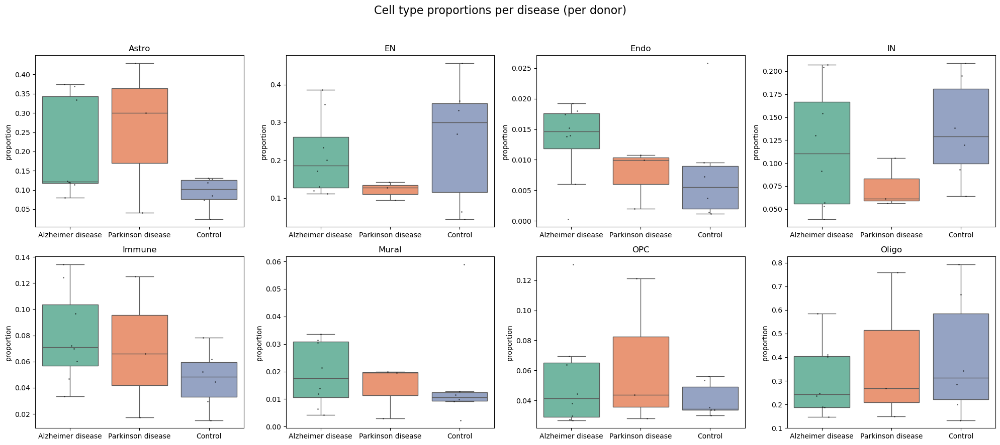

In [184]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

classes = df["class"].unique()
n = len(classes)

# nombre de lignes et colonnes dans la grille des panels
ncols = 4
nrows = int(np.ceil(n / ncols))

plt.figure(figsize=(20, 9))

for i, celltype in enumerate(classes, 1):
    sub = df[df["class"] == celltype]

    ax = plt.subplot(nrows, ncols, i)

    sns.boxplot(
        data=sub,
        x="disease",
        y="prop",
        palette="Set2",
        showfliers=False,
        ax=ax
    )

    sns.stripplot(
        data=sub,
        x="disease",
        y="prop",
        color="black",
        size=2,
        jitter=True,
        alpha=0.6,
        ax=ax
    )

    ax.set_title(celltype)
    ax.set_xlabel("")
    ax.set_ylabel("proportion")

plt.suptitle("Cell type proportions per disease (per donor)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

pvalues non significatives (je les ai calculées). Apparemment c'est normal et on fait jamais de tests stats sur des proportions, c'est vu qu'on a peu de donneur par condition, on voit pas grand chose. 

fin elodie

We first need to match the gene IDs in our list to those in the gene set libraries that will be used later:

In [ ]:
#This takes super long- don't run it again if you don't need to, I already saved the files and they're in the repo!

# mg = mygene.MyGeneInfo()

# for file in files:
#     print("Reading:", file)
#     df = pd.read_csv(file)

#     # Rename "gene" column to "gene_ensembl" to avoid having 2 "gene" columns in the final file
#     if "gene" in df.columns:
#         df.rename(columns={"gene": "gene_ensembl"}, inplace=True)

#     # Remove version numbers
#     df["gene_ensembl"] = df["gene_ensembl"].str.split(".").str[0]

    # Convert Ensembl IDs to gene symbols
    #out = mg.querymany(
        #df["gene_ensembl"].tolist(),
        #scopes="ensembl.gene",
        #fields="symbol",
        #species="human"
    #)

    # Build mapping dictionary
    #mapping = {item["query"]: item.get("symbol", None) for item in out}

    # Apply mapping
    #df["gene_symbol"] = df["gene_ensembl"].map(mapping)

    # Drop rows without valid gene symbols
    #df = df.dropna(subset=["gene_symbol"])

    # Uppercase symbols
    #df["gene_symbol"] = df["gene_symbol"].str.upper()

    # Final GSEA-ready column
    #df.rename(columns={"gene_symbol": "gene"}, inplace=True)

    # Save new file
    #new_filename = file.replace(".csv", "_genesymbol.csv")
    #df.to_csv(new_filename, index=False)
    #print("Saved:", new_filename)

    # Load the cleaned file back into df to use for the rest of the analysis
    #df = pd.read_csv(new_filename)

In [ ]:
# Check that the "gene" column now contains gene symbols
#print(df["gene"].head())

GSEA requires a ranked list of genes. To rank our genes for each file, we can create a function:

In [62]:
def prepare_ranking(df):
    df = pd.read_csv(df)
    df = df.dropna(subset = ["gene", "logFC", "PValue"])
    df["ranking"] = df["logFC"] * -np.log10(df["PValue"])
    df = df[["gene", "ranking"]].sort_values("ranking", ascending = False)
    return df

In [63]:
files[0]

'edgeR_results/edgeR_Mural_AD_vs_PD.csv'

In [64]:
prepare_ranking(files[0])

KeyError: ['gene']

Loading the needed gene set libraries:

In [ ]:
#libs = [
#    "PanglaoDB_Augmented_2021",
 #   "CellMarker_Augmented_2021",
  #  "GO_Biological_Process_2021",
   # "Reactome_2022",
    #"KEGG_2021_Human"
#]

libs = ["PanglaoDB_Augmented_2021", "MSigDB_Hallmark_2020", "GO_Biological_Process_2021"]

for lib in libs:
    try:
        gp.get_library(name = lib, organism = "Human")
        print(f"Loaded: {lib}")
    except Exception as e:
        print(f"FAILED: {lib} → {e}")

Loaded: PanglaoDB_Augmented_2021
Loaded: MSigDB_Hallmark_2020
Loaded: GO_Biological_Process_2021


Running preranked GSEA:

In [ ]:
# Check that the files with gene symbols are being detected
print("Files detected:", files)

Files detected: ['edgeR_results\\edgeR_Astro_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Astro_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_Astro_PD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Endo_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Endo_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_Endo_PD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_EN_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_EN_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_EN_PD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Immune_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Immune_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_Immune_PD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_IN_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_IN_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_IN_PD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Mural_AD_vs_CTRL_GENESYMBOL.csv', 'edgeR_results\\edgeR_Mural_AD_vs_PD_GENESYMBOL.csv', 'edgeR_results\\edgeR_Mural_PD_vs_CTRL_GENESYMBOL.csv', 'edge

In [ ]:
# Don't run this again if there are no changes in the pipeline/previous results - I've already run it once and have the results saved

#outdir = "GSEA_results"
#os.makedirs(outdir, exist_ok=True)

#for file in files:
 #   print("Starting:", file)

  #  try:
   #     df = pd.read_csv(file)
    #    ranking = prepare_ranking(df)

     #   name = os.path.splitext(os.path.basename(file))[0]

        # -------------------------------
        # FIX: Create both output folders
        # -------------------------------
      #  result_dir = os.path.join(outdir, name)
       # prerank_dir = os.path.join(result_dir, "prerank")

        #os.makedirs(prerank_dir, exist_ok=True)
        # -------------------------------

        #pre_res = gp.prerank(
         #   rnk = ranking,
          #  gene_sets = libs,
           # outdir = f"{outdir}/{name}",
            #permutation_num = 100,
          #  min_size = 5,
           # max_size = 5000,
           # no_plot = True,
           # format = "png",
           # sanitize = True
           # )
        
        #print(f"Finished: {name}")

   # except Exception as e:
      #  print(f"Error processing {file}:\n{e}")

Starting: edgeR_results\edgeR_Astro_AD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_Astro_AD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_Astro_AD_vs_PD_GENESYMBOL.csv
Finished: edgeR_Astro_AD_vs_PD_GENESYMBOL
Starting: edgeR_results\edgeR_Astro_PD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_Astro_PD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_Endo_AD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_Endo_AD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_Endo_AD_vs_PD_GENESYMBOL.csv
Finished: edgeR_Endo_AD_vs_PD_GENESYMBOL
Starting: edgeR_results\edgeR_Endo_PD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_Endo_PD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_EN_AD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_EN_AD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_EN_AD_vs_PD_GENESYMBOL.csv
Finished: edgeR_EN_AD_vs_PD_GENESYMBOL
Starting: edgeR_results\edgeR_EN_PD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_EN_PD_vs_CTRL_GENESYMBOL
Starting: edgeR_results\edgeR_Immune_AD_vs_CTRL_GENESYMBOL.csv
Finished: edgeR_Imm

GSEA Results: Ridge plot representation for MSigDB terms per cell type

In [17]:
# --- Extract leading-edge gene lists safely from all MSigDB reports ---

lead_records = []

for rpt in report_files:
    df = pd.read_csv(rpt)

    # Only keep MSigDB Hallmark rows
    df = df[df["Term"].str.contains("HALLMARK", case=False, na=False)]
    if df.empty:
        continue

    comp = os.path.normpath(rpt).split(os.sep)[-2]
    comp = comp.replace("edgeR_", "").replace("_GENESYMBOL", "")

    # Detect any column that contains leading-edge info
    lead_cols = [
        c for c in df.columns
        if "lead" in c.lower()
        or "core" in c.lower()
        or "enrich" in c.lower()
        or "edge" in c.lower()
    ]

    if not lead_cols:
        print(f"⚠️ No leading-edge column found in: {rpt}")
        continue

    lead_col = lead_cols[0]     # choose best match
    print(f"Using leading-edge column '{lead_col}' for {comp}")

    # Normalize to list
    df["Lead_genes"] = (
        df[lead_col]
        .astype(str)
        .str.replace(" ", "")
        .str.replace(",", ";")
        .str.split(";")
    )

    df["comparison"] = comp
    df["pathway"] = df["Term"].str.replace("_", " ", regex=False)

    lead_records.append(df[["comparison", "pathway", "Lead_genes"]])

# Final combined table
leading_df = pd.concat(lead_records, ignore_index=True)
print("Leading-edge table:", leading_df.shape)
leading_df.head()

Using leading-edge column 'Lead_genes' for Astro_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for Astro_AD_vs_PD
Using leading-edge column 'Lead_genes' for Astro_PD_vs_CTRL
Using leading-edge column 'Lead_genes' for Endo_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for Endo_AD_vs_PD
Using leading-edge column 'Lead_genes' for Endo_PD_vs_CTRL
Using leading-edge column 'Lead_genes' for EN_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for EN_AD_vs_PD
Using leading-edge column 'Lead_genes' for EN_PD_vs_CTRL
Using leading-edge column 'Lead_genes' for Immune_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for Immune_AD_vs_PD
Using leading-edge column 'Lead_genes' for Immune_PD_vs_CTRL
Using leading-edge column 'Lead_genes' for IN_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for IN_AD_vs_PD
Using leading-edge column 'Lead_genes' for IN_PD_vs_CTRL
Using leading-edge column 'Lead_genes' for Mural_AD_vs_CTRL
Using leading-edge column 'Lead_genes' for Mural_AD_vs_PD
Using lead

,comparison,pathway,Lead_genes
0,Astro_AD_vs_CTRL,MSigDB Hallmark 2020 Interferon Alpha Response,"[IFI44L, GBP2, SAMD9, WARS1, IFI44, IFITM3, IR..."
1,Astro_AD_vs_CTRL,MSigDB Hallmark 2020 Interferon Gamma Response,"[IFI44L, IFIT1, WARS1, IFI44, IFITM3, SELP, IR..."
2,Astro_AD_vs_CTRL,MSigDB Hallmark 2020 Xenobiotic Metabolism,"[GSTT2, PDK4, TYR, SERPINE1, EPHA2, ABCC2, AHC..."
3,Astro_AD_vs_CTRL,MSigDB Hallmark 2020 Allograft Rejection,"[GBP2, WARS1, RPL39, GCNT1, IL7, HLA-A, STAT1,..."
4,Astro_AD_vs_CTRL,MSigDB Hallmark 2020 Apical Junction,"[CERCAM, ARHGEF6, AMH, CNTN1, CADM2, EGFR, HAD..."


         comparison                                          pathway  \
0  Astro_AD_vs_CTRL  MSigDB Hallmark 2020  Interferon Alpha Response   
1  Astro_AD_vs_CTRL  MSigDB Hallmark 2020  Interferon Gamma Response   
2  Astro_AD_vs_CTRL      MSigDB Hallmark 2020  Xenobiotic Metabolism   
3  Astro_AD_vs_CTRL        MSigDB Hallmark 2020  Allograft Rejection   
4  Astro_AD_vs_CTRL            MSigDB Hallmark 2020  Apical Junction   

        NES       FDR                                         Lead_genes  
0 -1.992035  0.000000  IFI44L;GBP2;SAMD9;WARS1;IFI44;IFITM3;IRF1;IL7;...  
1 -1.894391  0.000619  IFI44L;IFIT1;WARS1;IFI44;IFITM3;SELP;IRF1;IL7;...  
2  1.498935  0.453423  GSTT2;PDK4;TYR;SERPINE1;EPHA2;ABCC2;AHCY;MPP2;...  
3 -1.483126  0.612385  GBP2;WARS1;RPL39;GCNT1;IL7;HLA-A;STAT1;RPL9;IG...  
4  1.465747  0.523071  CERCAM;ARHGEF6;AMH;CNTN1;CADM2;EGFR;HADH;RSU1;...  
(1200, 5)
After filtering: (1200, 5)
Top ridge pathways: ['MSigDB Hallmark 2020  Interferon Alpha Response', 'MSigDB 

<Figure size 1000x1200 with 0 Axes>

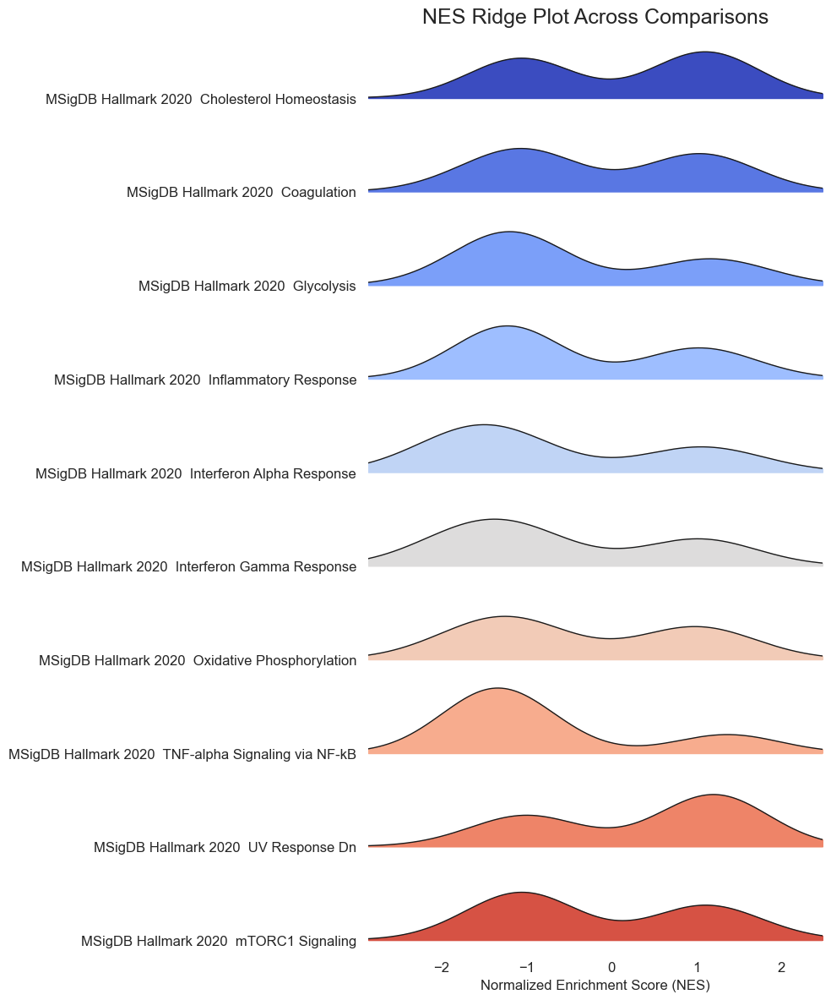

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import joypy

# ---------------------------------------------------------
# 1) STARTING DATA: your msigdb_df (1200 × 4)
# columns: comparison | pathway | NES | FDR
# ---------------------------------------------------------

print(msigdb_df.head())
print(msigdb_df.shape)

# Sanity filter: remove NA NES
df = msigdb_df.dropna(subset=["NES"]).copy()

# Optional: focus on hallmark only (should already be true)
df = df[df["pathway"].str.contains("HALLMARK", case=False, na=False)]

print("After filtering:", df.shape)

# ---------------------------------------------------------
# 2) SELECT TOP PATHWAYS TO PLOT (20 with strongest NES variation)
# ---------------------------------------------------------
# Compute variance across comparisons
path_var = df.groupby("pathway")["NES"].var().sort_values(ascending=False)

top_paths = path_var.head(20).index.tolist()
print("Top ridge pathways:", top_paths)

df_top = df[df["pathway"].isin(top_paths)]

# ---------------------------------------------------------
# 3) Ridge plot
# ---------------------------------------------------------
plt.figure(figsize=(10, 12))

joypy.joyplot(
    df_top,
    by="pathway",
    column="NES",
    figsize=(10, 12),
    colormap=plt.cm.coolwarm,
    linewidth=1,
    overlap=0.8
)

plt.title("NES Ridge Plot Across Comparisons", fontsize=18)
plt.xlabel("Normalized Enrichment Score (NES)")
plt.tight_layout()
plt.show()

Detected cell types: ['Astro_AD_vs_CTRL' 'Astro_AD_vs_PD' 'Astro_PD_vs_CTRL' 'Endo_AD_vs_CTRL'
 'Endo_AD_vs_PD' 'Endo_PD_vs_CTRL' 'EN_AD_vs_CTRL' 'EN_AD_vs_PD'
 'EN_PD_vs_CTRL' 'Immune_AD_vs_CTRL' 'Immune_AD_vs_PD' 'Immune_PD_vs_CTRL'
 'IN_AD_vs_CTRL' 'IN_AD_vs_PD' 'IN_PD_vs_CTRL' 'Mural_AD_vs_CTRL'
 'Mural_AD_vs_PD' 'Mural_PD_vs_CTRL' 'Oligo_AD_vs_CTRL' 'Oligo_AD_vs_PD'
 'Oligo_PD_vs_CTRL' 'OPC_AD_vs_CTRL' 'OPC_AD_vs_PD' 'OPC_PD_vs_CTRL']


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


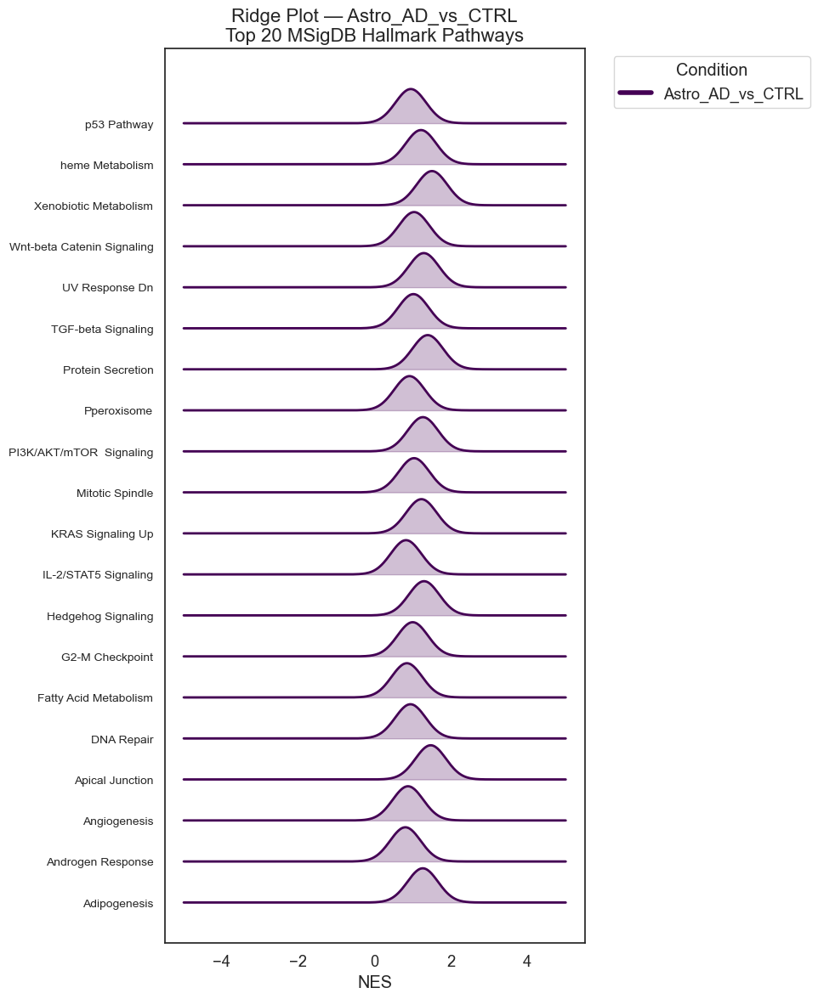

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


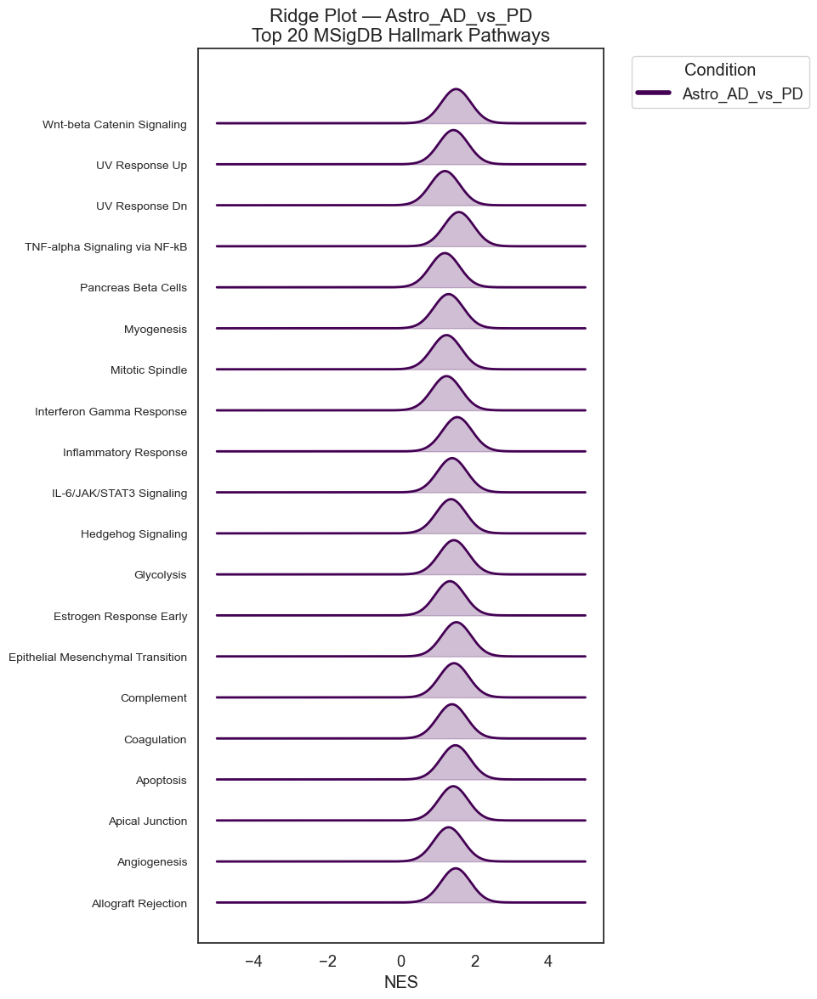

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


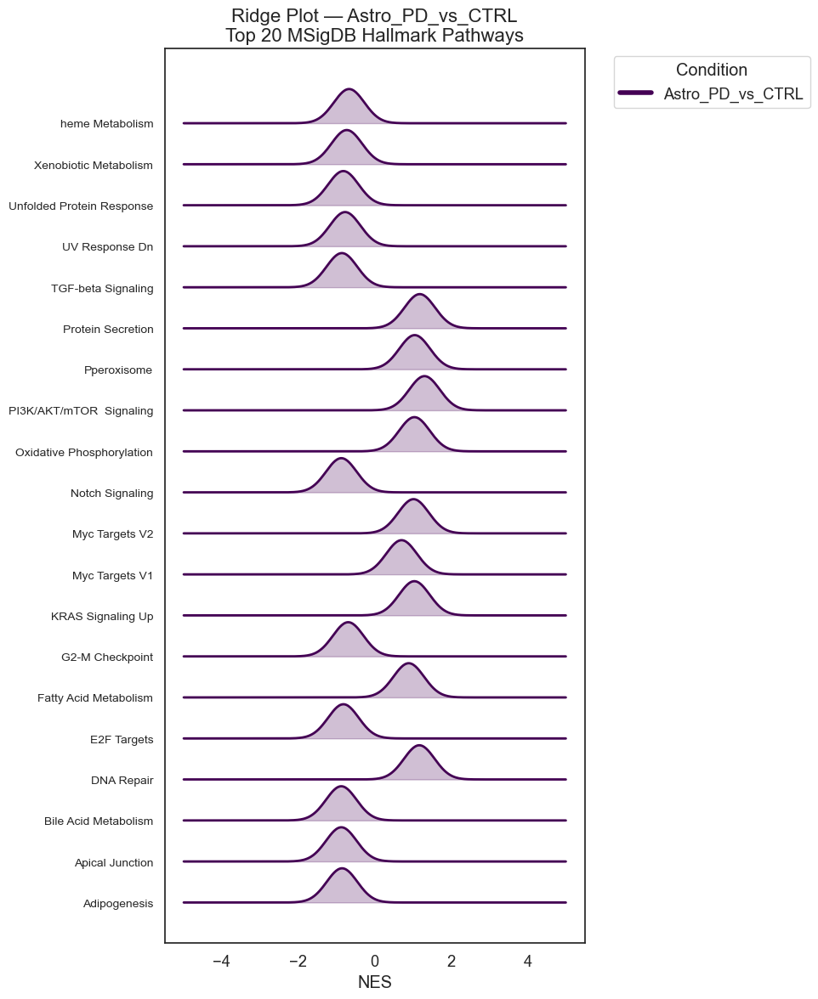

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


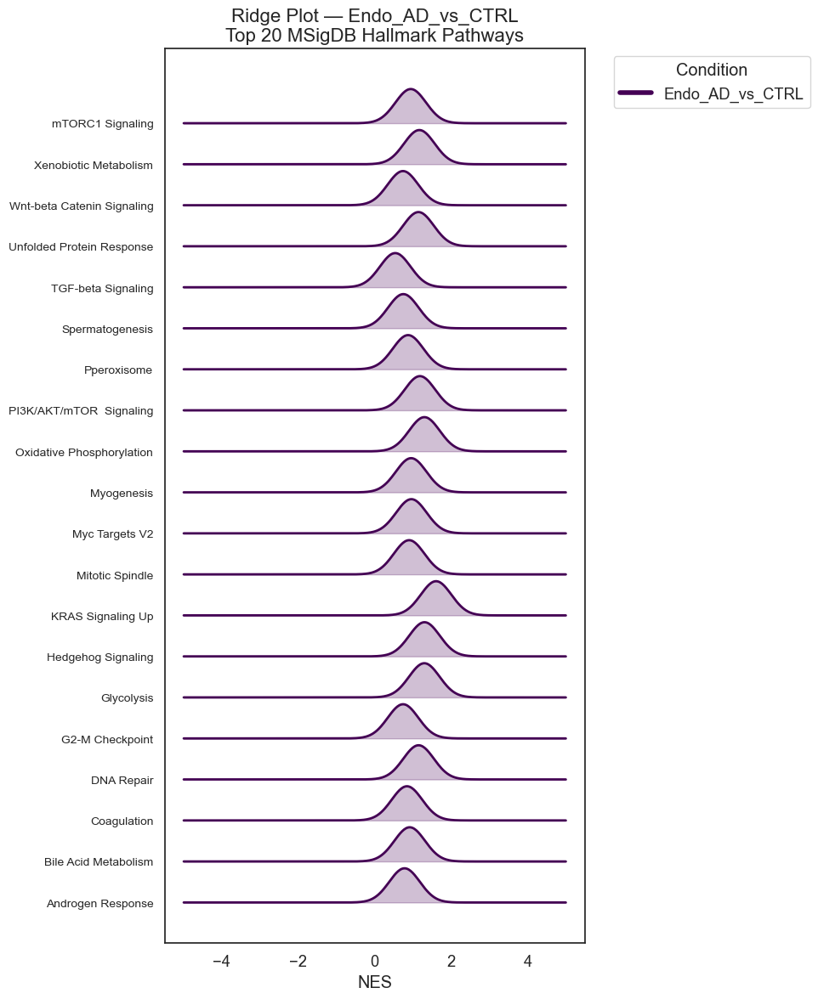

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


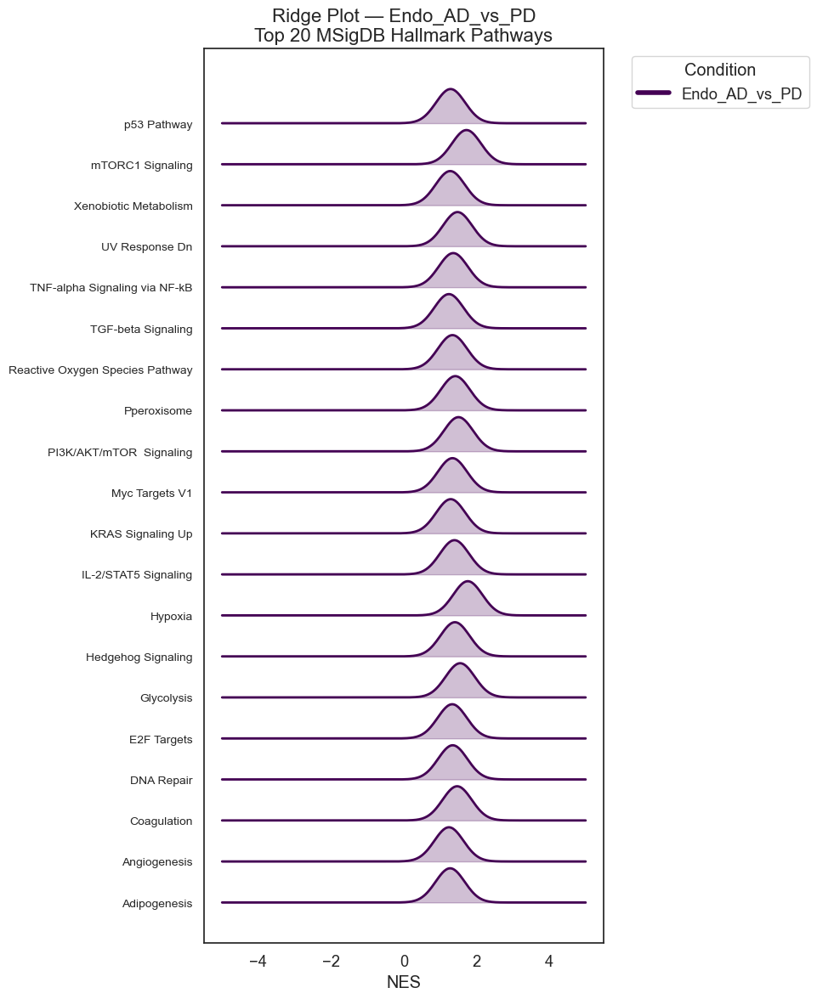

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


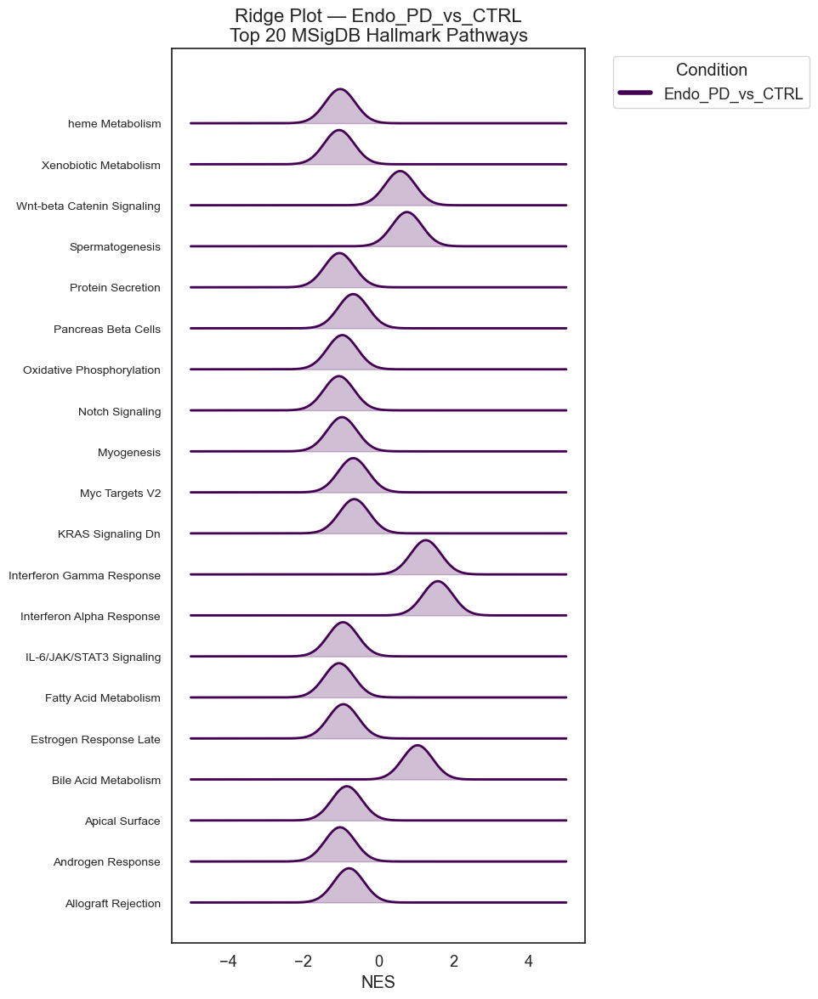

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


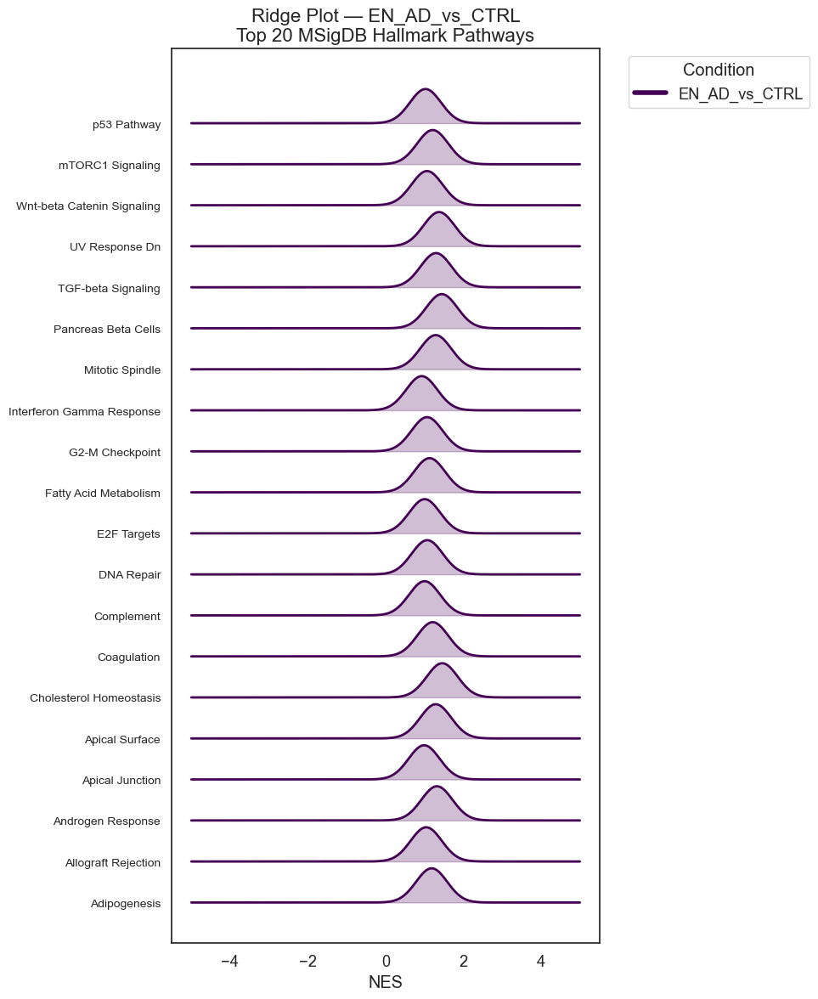

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


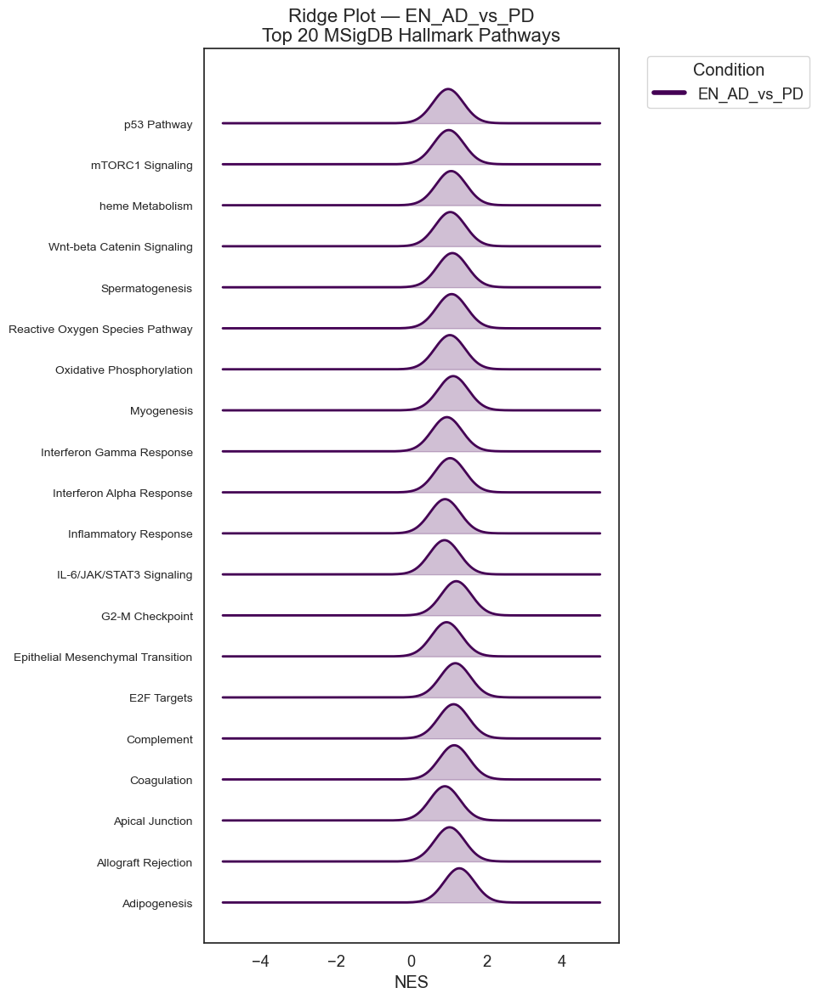

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


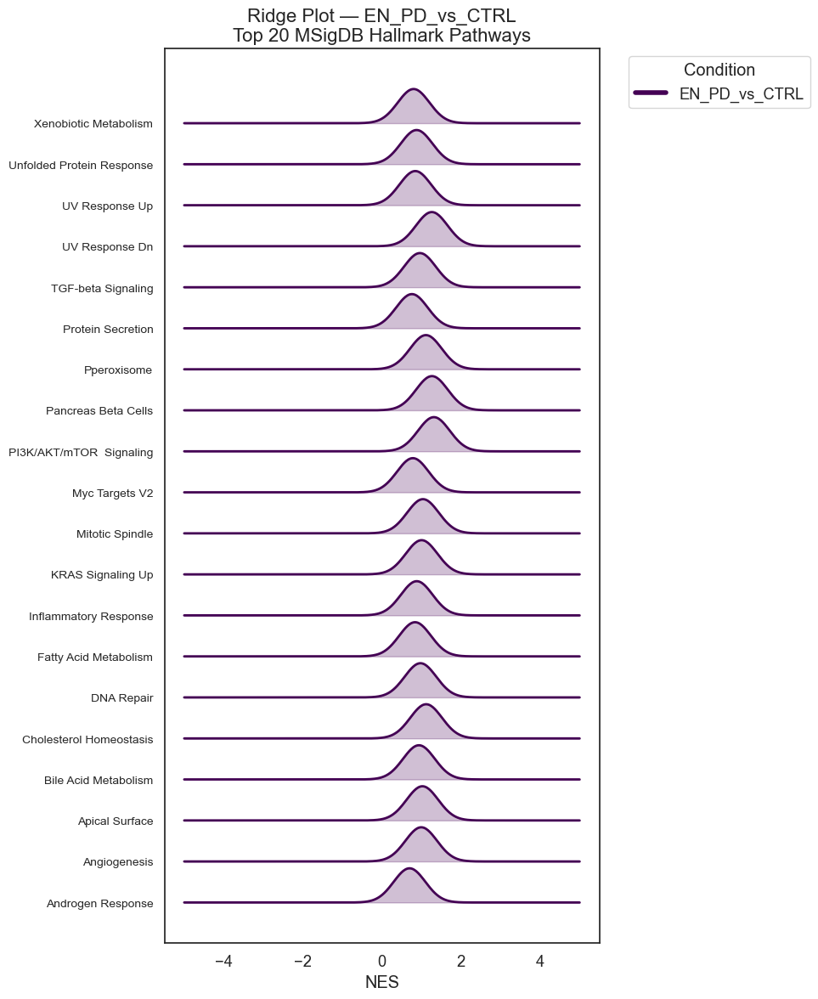

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


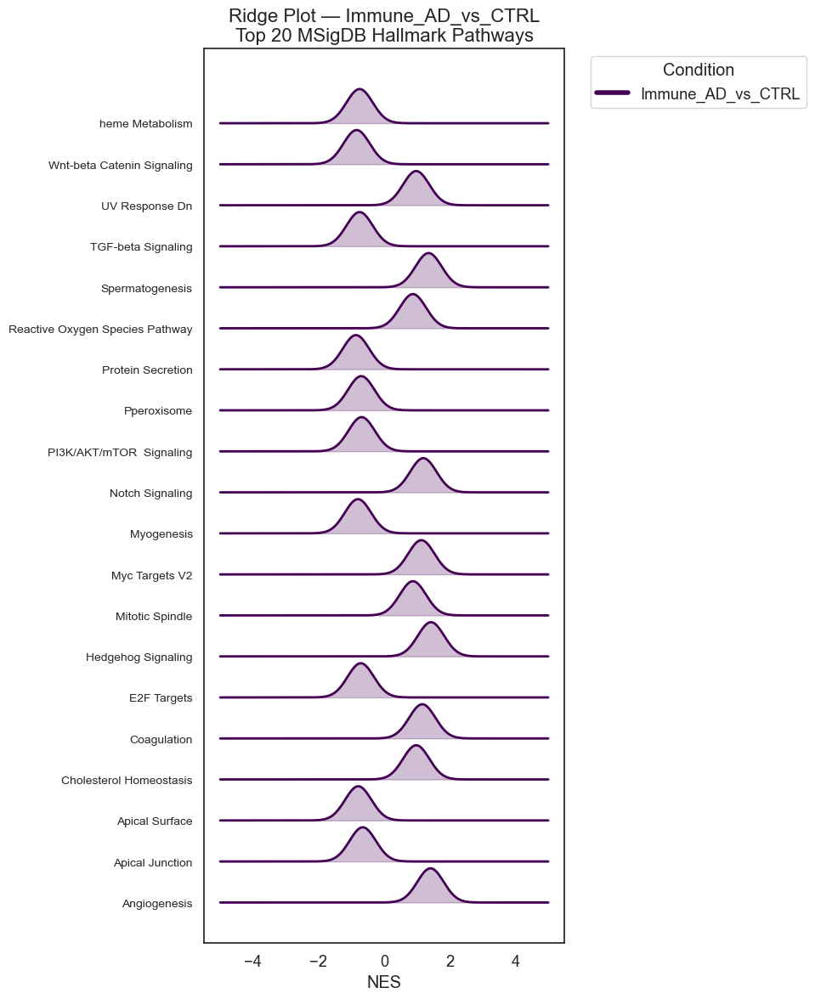

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


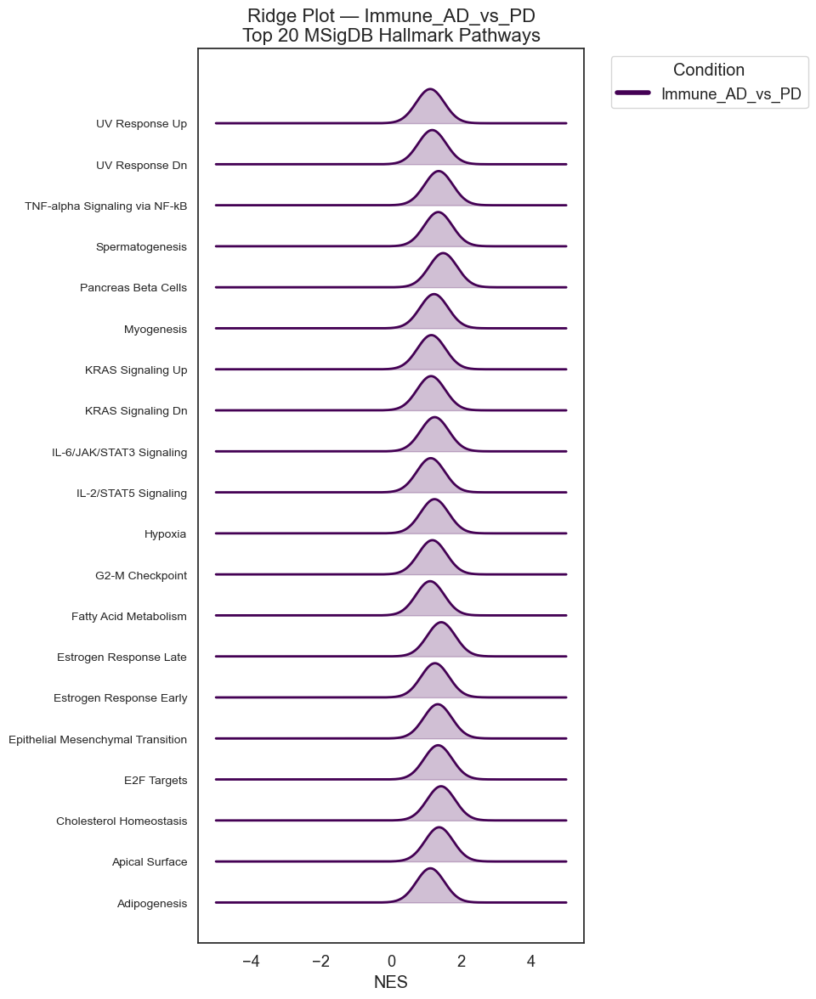

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


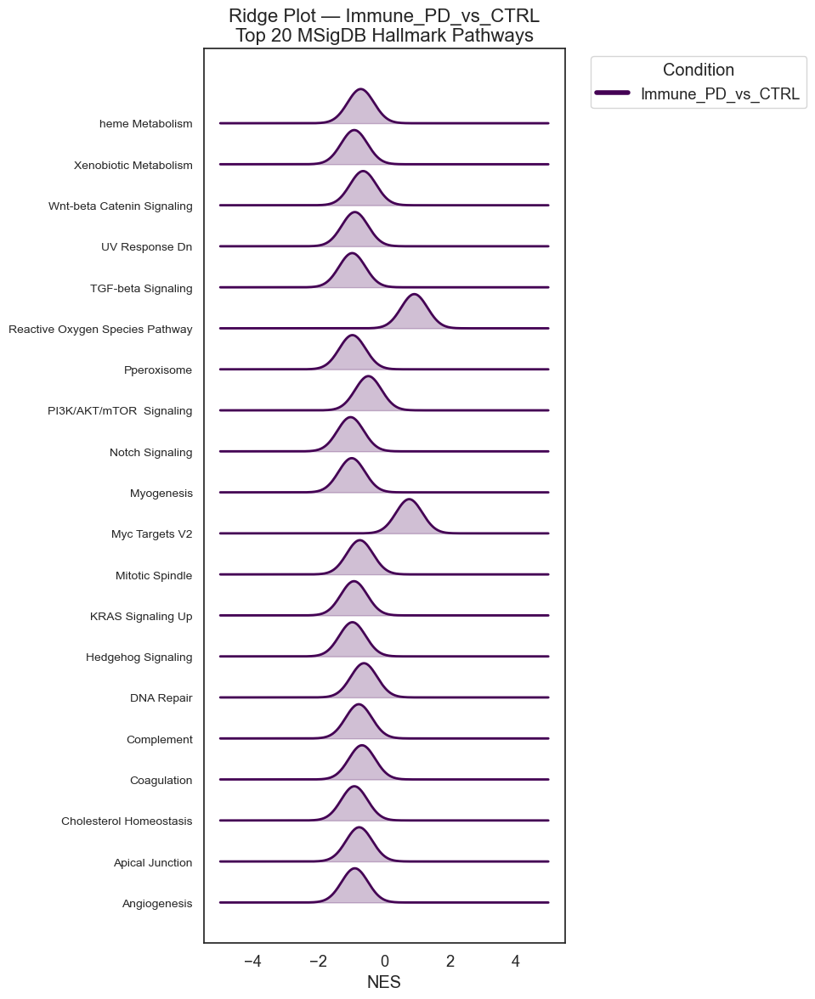

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


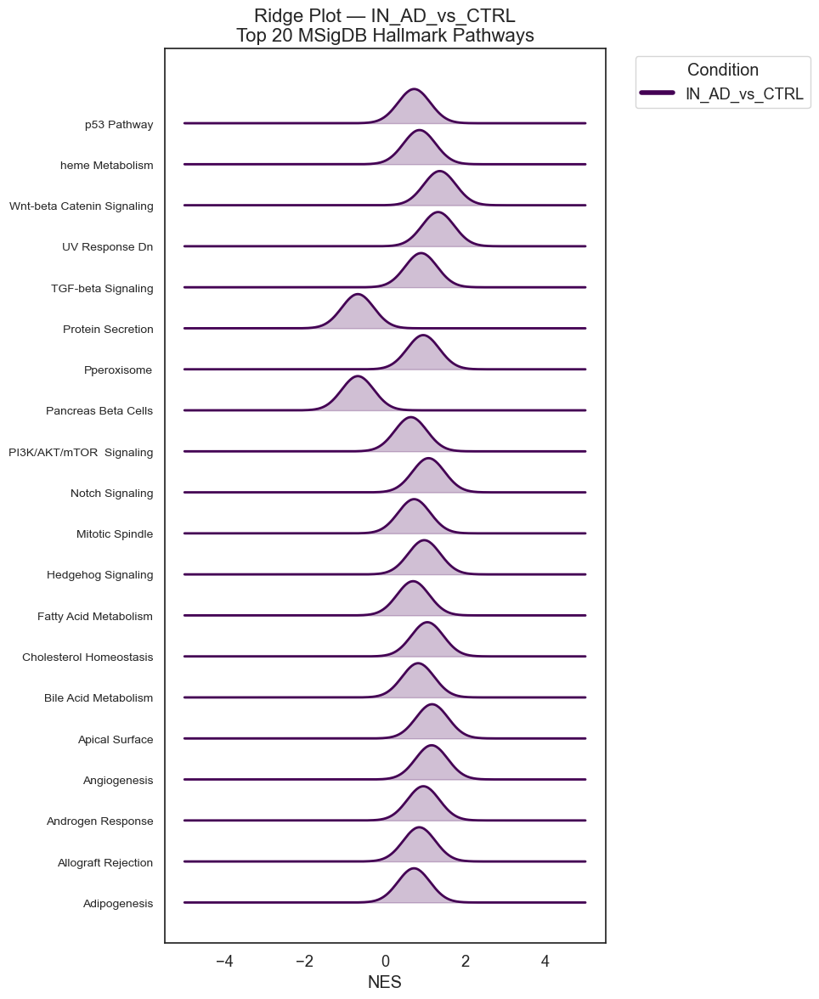

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


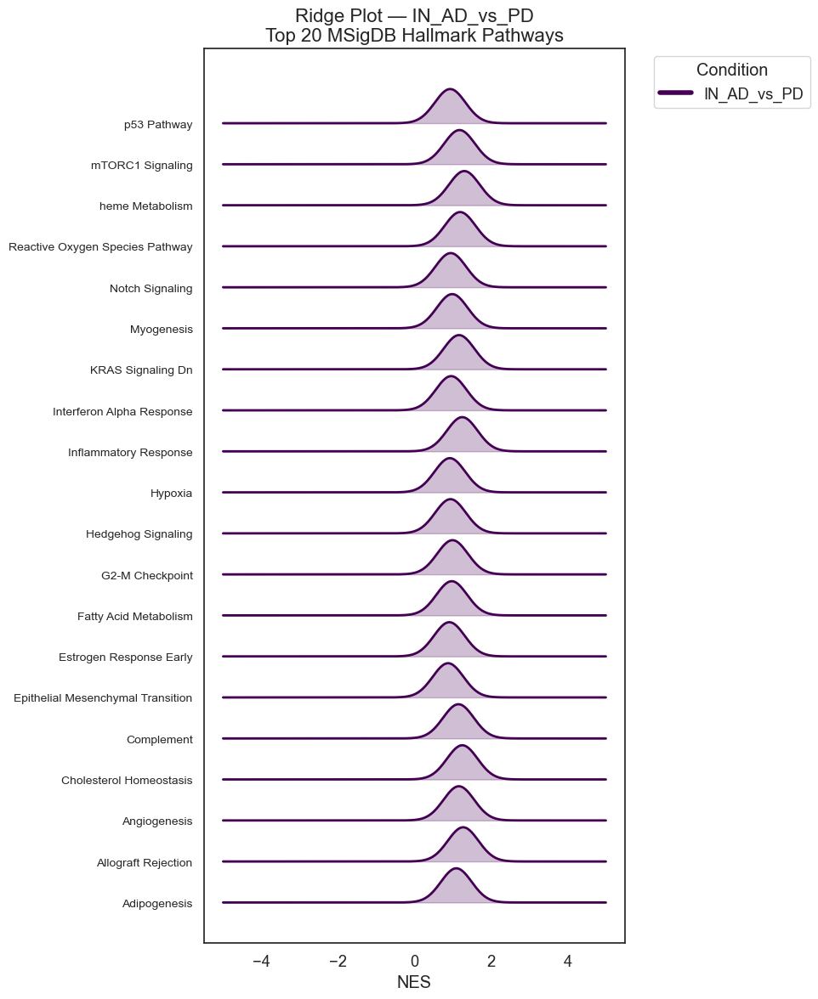

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


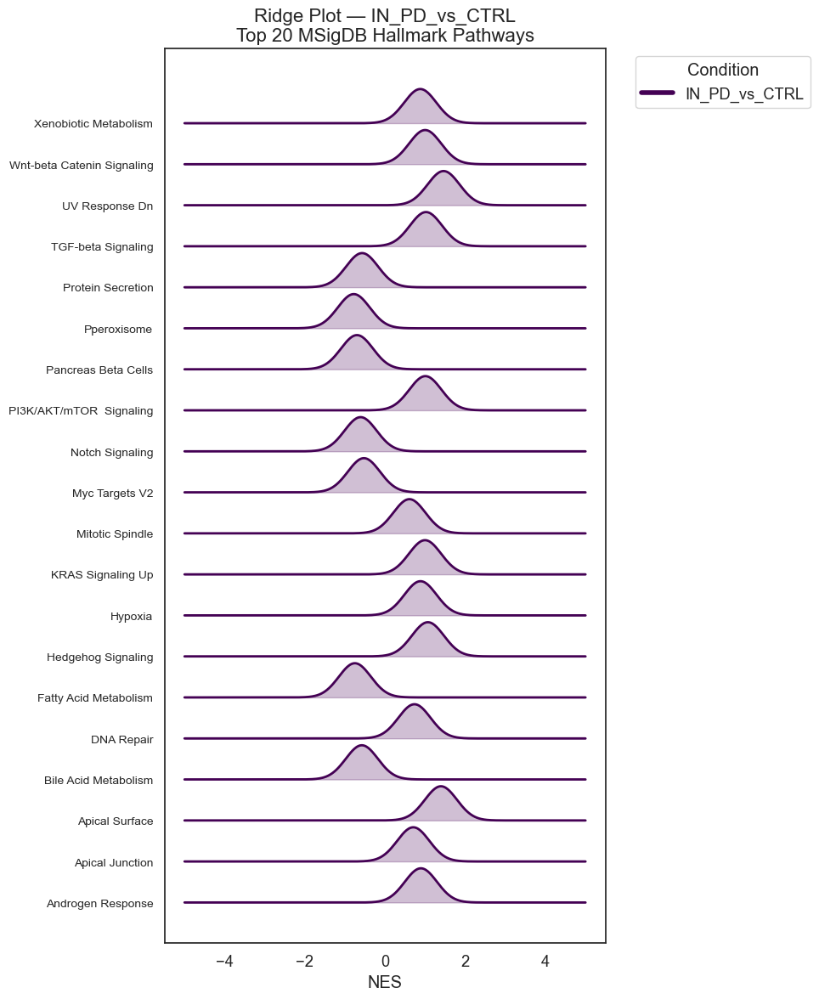

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


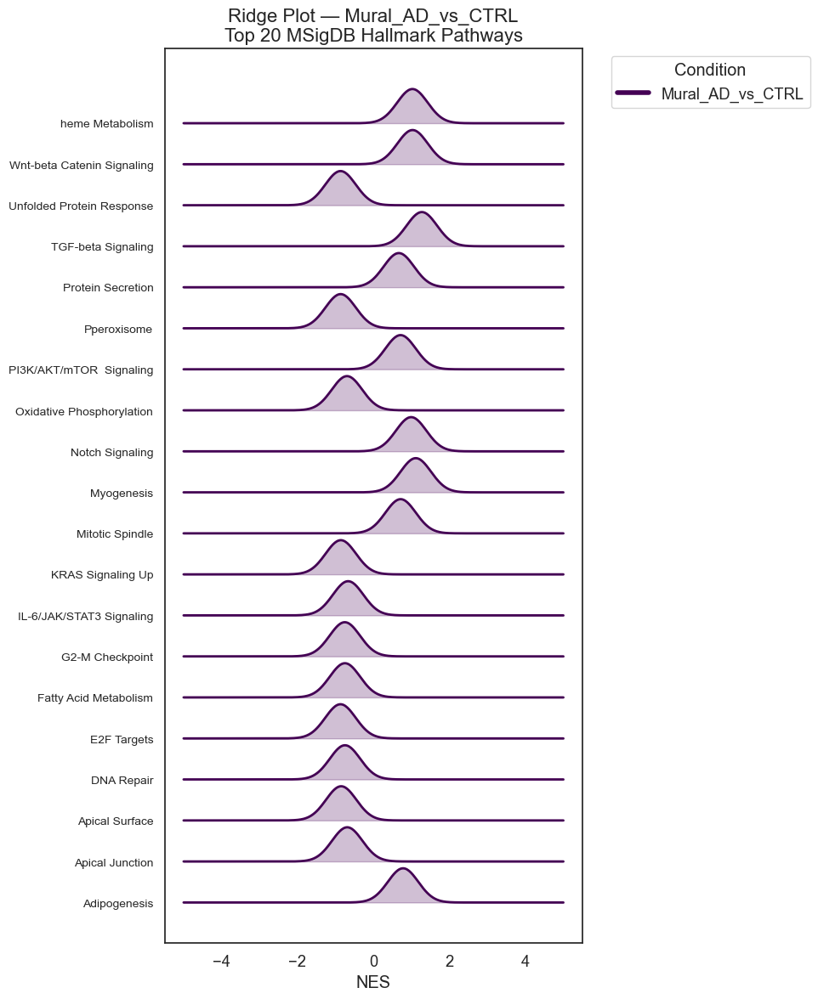

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


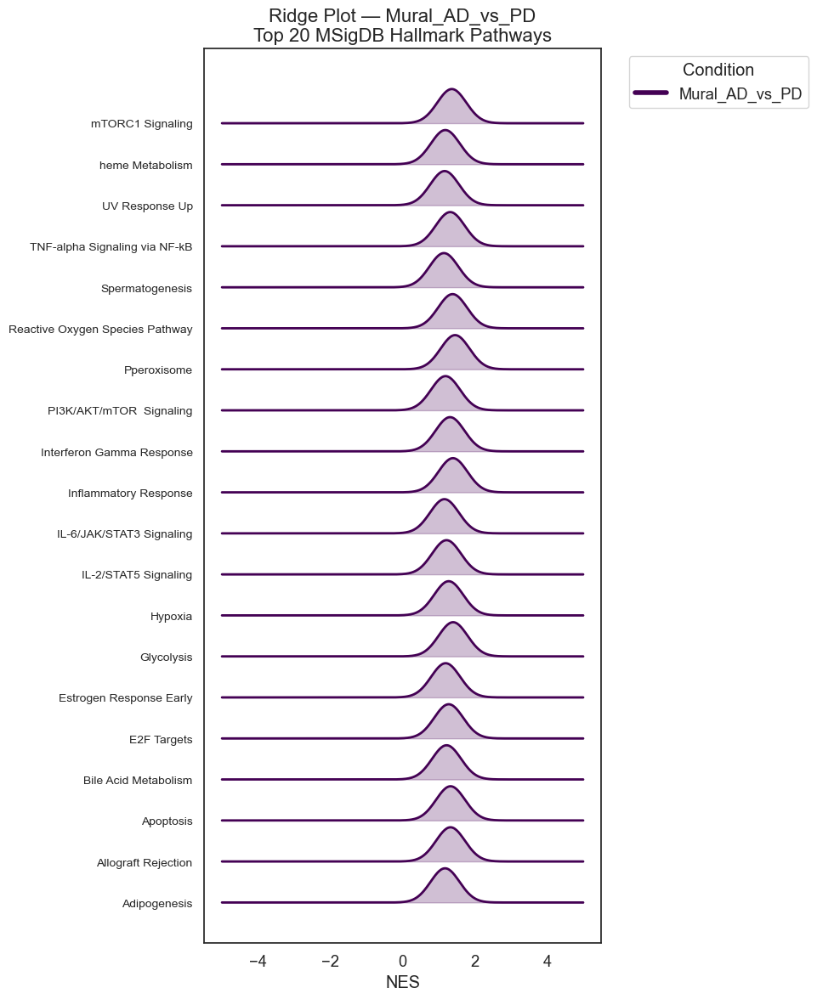

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


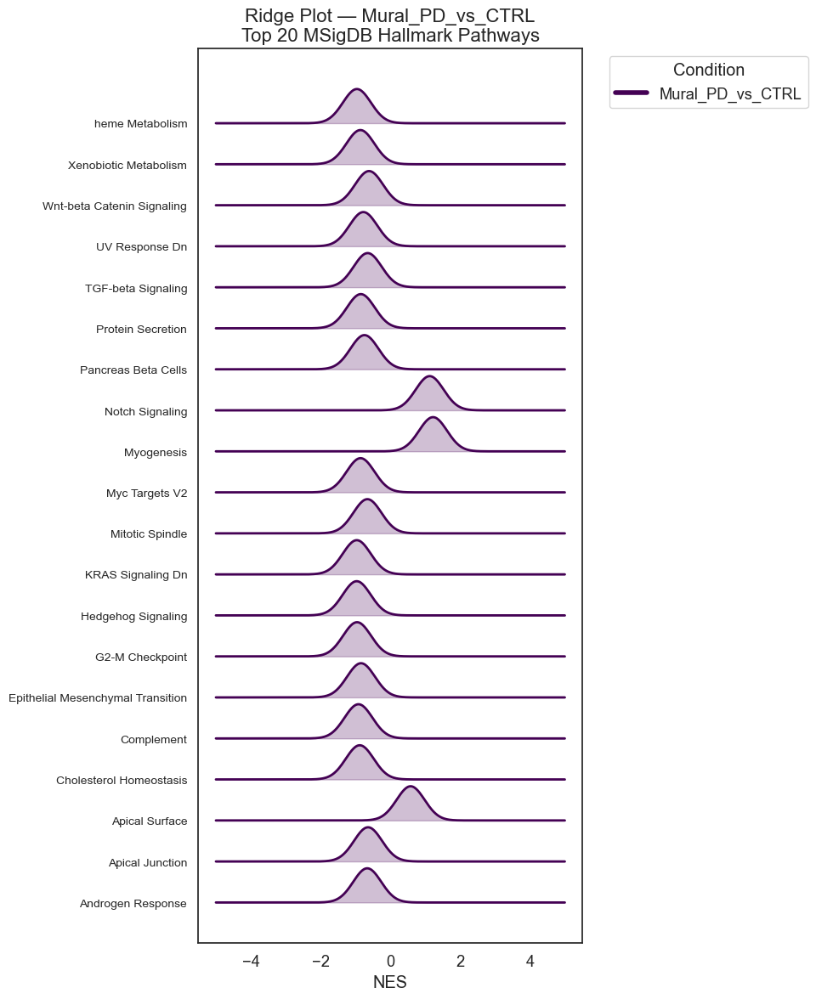

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


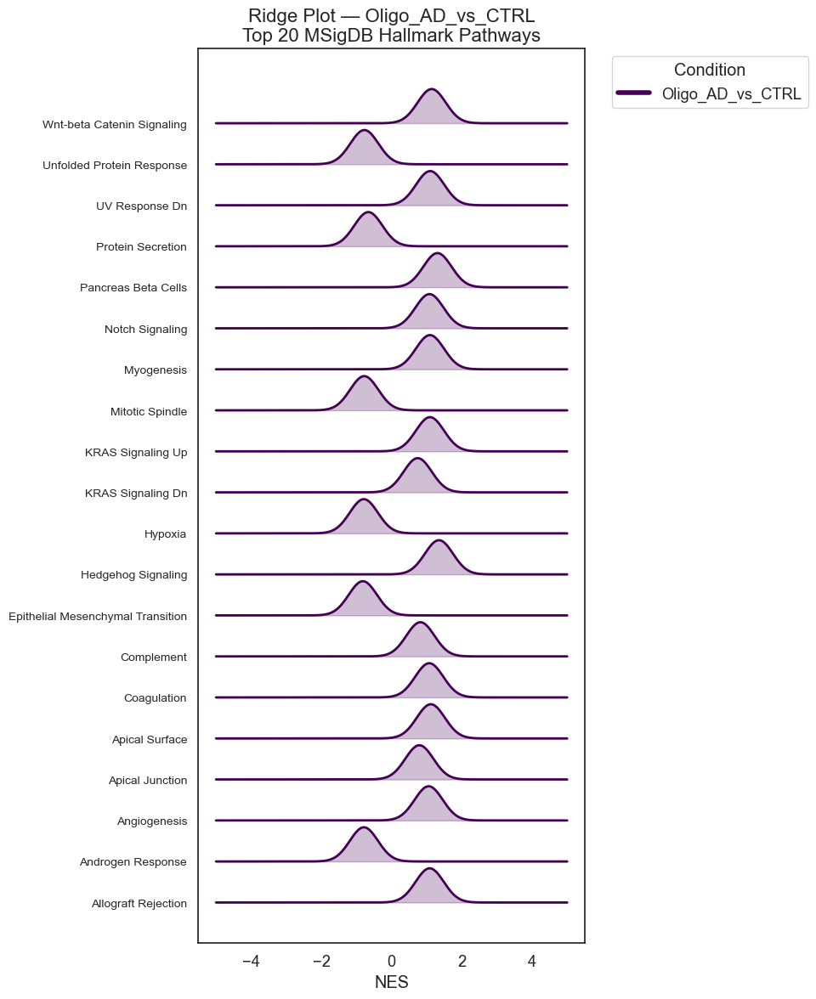

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


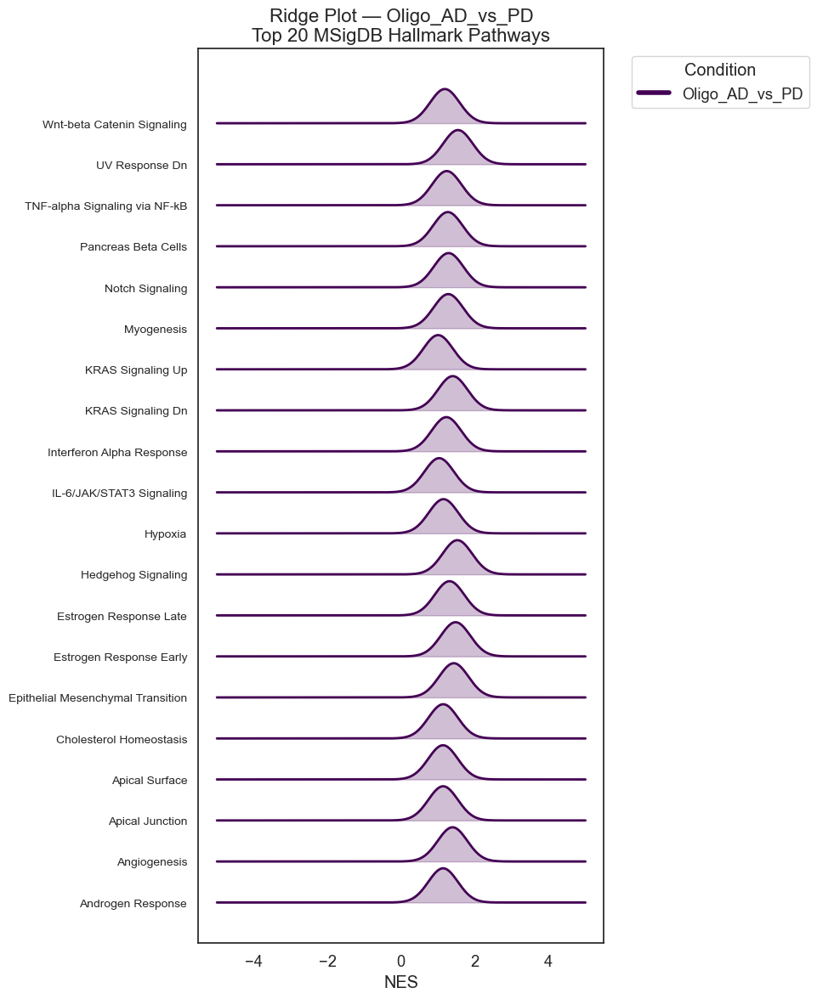

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


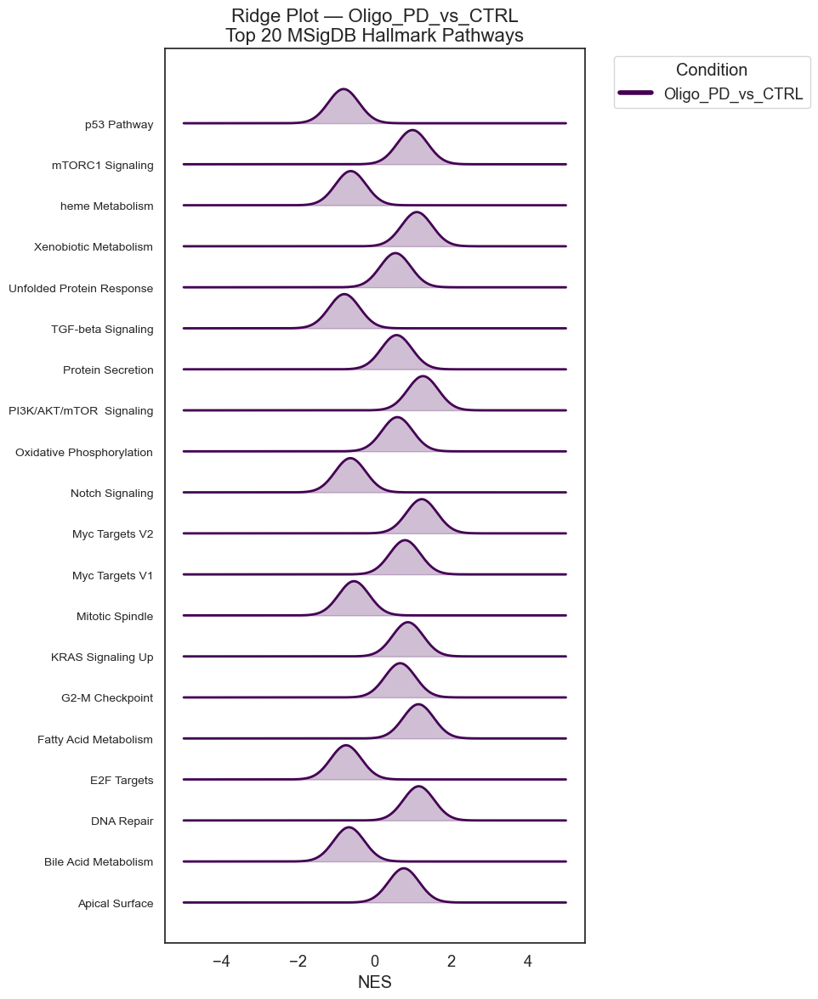

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


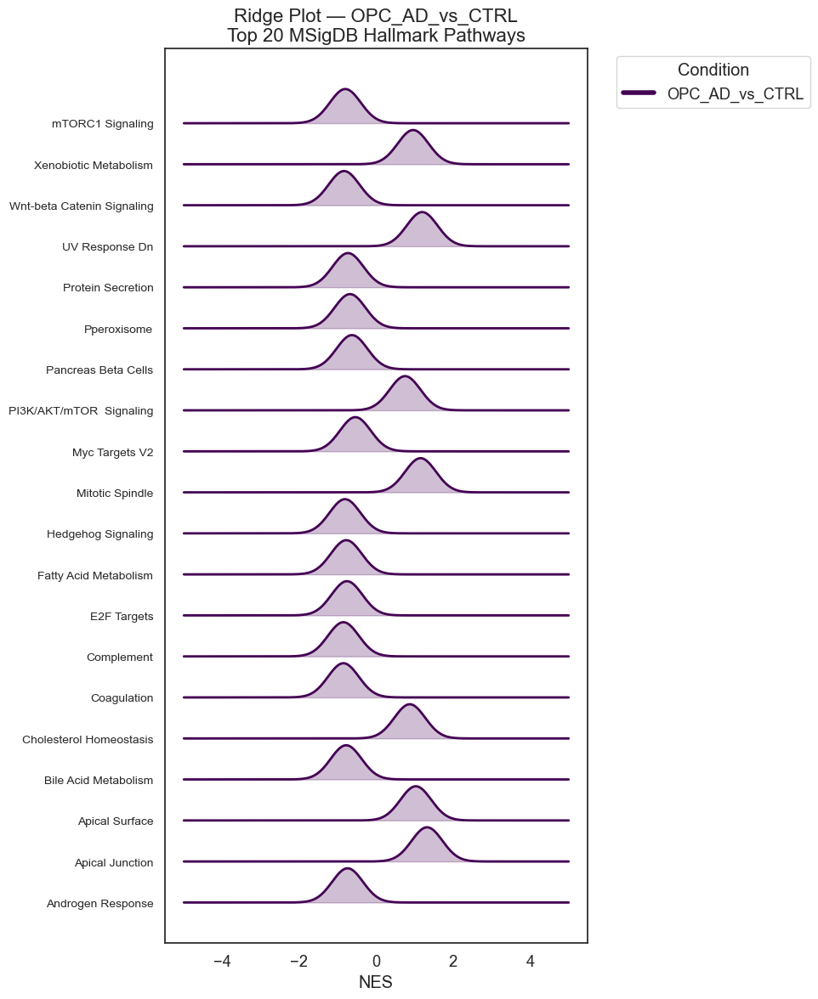

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


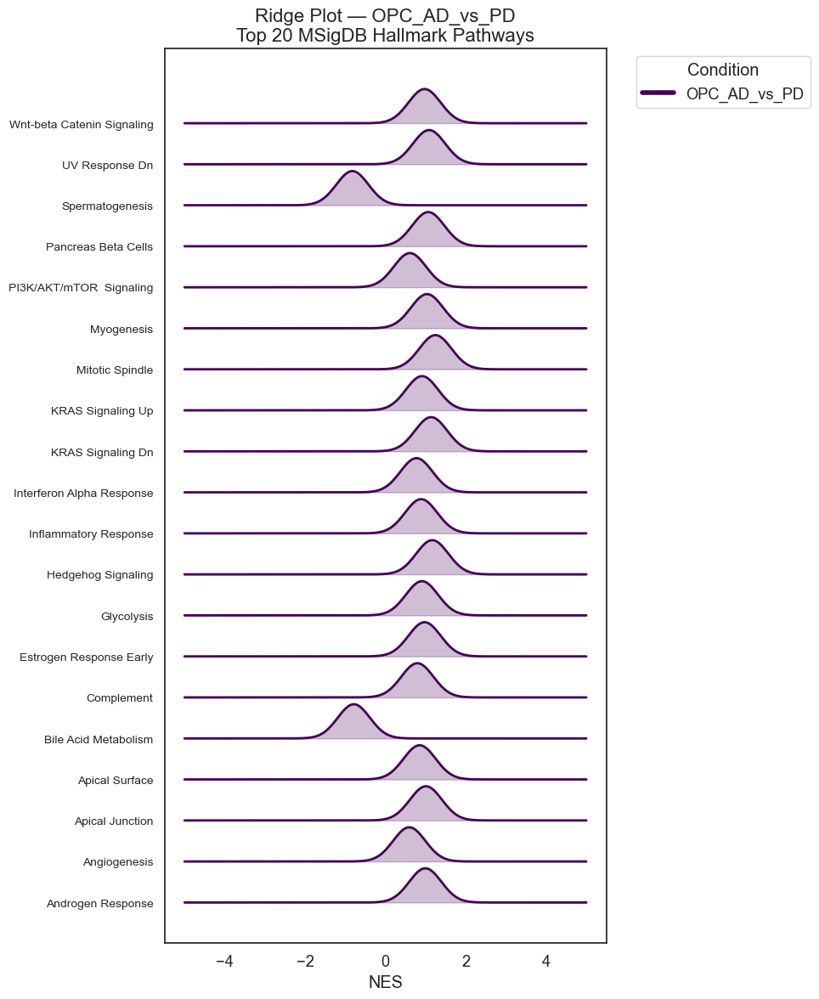

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\2390096652.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap("viridis", len(conditions))


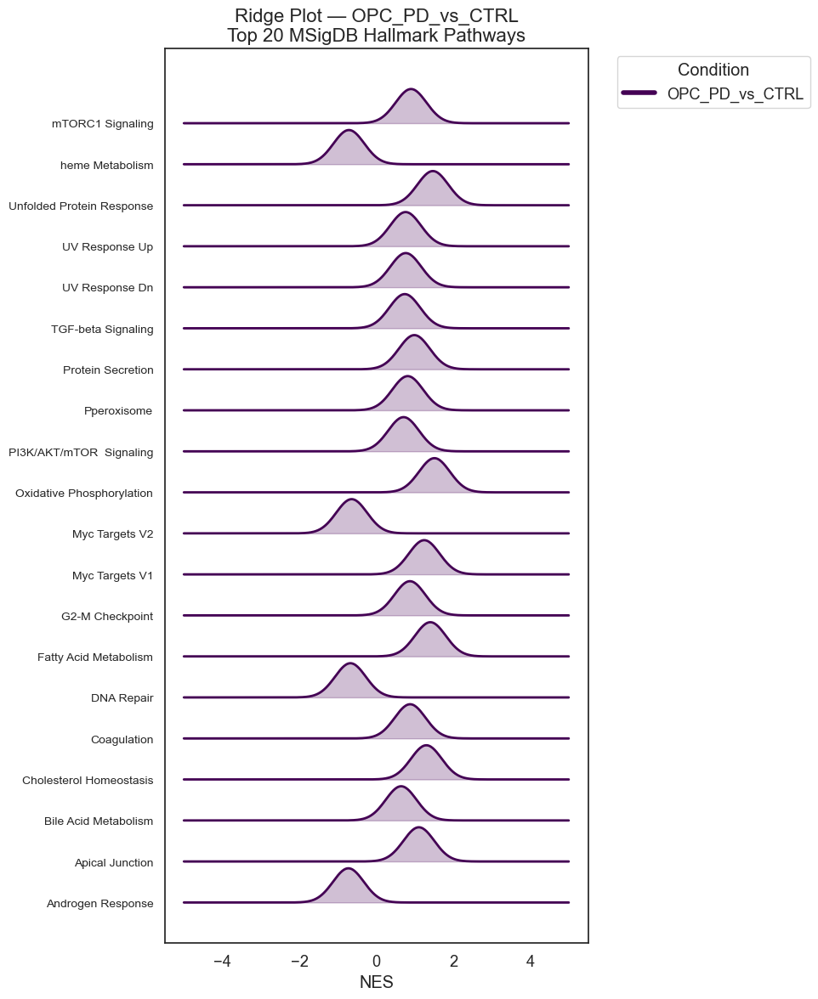

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

# --------------------------------------------------------------------
# Load the MSigDB-only table you already generated
# --------------------------------------------------------------------
msigdb_df = pd.read_csv("MSigDB_Hallmark_only_results.csv")

# Clean pathway names
msigdb_df["pathway"] = (
    msigdb_df["pathway"]
    .str.replace("MSigDB Hallmark 2020", "", regex=False)
    .str.replace("_", " ", regex=False)
    .str.strip()
)

# --------------------------------------------------------------------
# Detect cell types correctly from your exact comparison labels
# Example: "Astro AD vs CTRL"
# --------------------------------------------------------------------
def extract_celltype(comp):
    """Extracts the first word before the space as the cell type."""
    return comp.split()[0]  # Astro, Endo, EN, Immune, IN, Mural, Oligo, OPC

msigdb_df["celltype"] = msigdb_df["comparison"].apply(extract_celltype)

# Confirm the mapping works
print("Detected cell types:", msigdb_df["celltype"].unique())

# --------------------------------------------------------------------
# Generate ridge plots per cell type
# --------------------------------------------------------------------
celltypes = msigdb_df["celltype"].unique()

for ct in celltypes:
    df_ct = msigdb_df[msigdb_df["celltype"] == ct].copy()

    if df_ct.empty:
        print(f"⚠ No MSigDB pathways found for {ct}")
        continue

    # --------------------------
    # Select top 20 enriched pathways for this cell type
    # --------------------------
    df_ct_sorted = df_ct.sort_values("NES", ascending=False)
    top_paths = df_ct_sorted["pathway"].unique()[:20]

    df_plot = df_ct[df_ct["pathway"].isin(top_paths)].copy()

    # --------------------------
    # Assign a Y position to each pathway
    # --------------------------
    df_plot["path_id"] = df_plot["pathway"].astype("category").cat.codes
    df_plot["ypos"] = df_plot["path_id"] * 1.2  # vertical spacing

    # --------------------------
    # Ridge Plot
    # --------------------------
    plt.figure(figsize=(10, 12))
    conditions = sorted(df_plot["comparison"].unique())

    # Color palette
    palette = cm.get_cmap("viridis", len(conditions))

    for i, cond in enumerate(conditions):
        subset = df_plot[df_plot["comparison"] == cond]

        if subset.empty:
            continue

        for _, row in subset.iterrows():
            y = row["ypos"]
            x = np.linspace(-5, 5, 400)
            curve = np.exp(-(x - row["NES"])**2 / (2 * 0.4**2))

            plt.plot(x, curve + y, color=palette(i), lw=2)
            plt.fill_between(x, y, curve + y, alpha=0.25, color=palette(i))

    # Y‑axis labels (pathways)
    y_labels = (
        df_plot[["pathway", "ypos"]]
        .drop_duplicates()
        .sort_values("ypos")
    )
    plt.yticks(y_labels["ypos"], y_labels["pathway"], fontsize=10)

    plt.xlabel("NES")
    plt.title(f"Ridge Plot — {ct}\nTop 20 MSigDB Hallmark Pathways", fontsize=16)

    handles = [
        plt.Line2D([0], [0], color=palette(i), lw=4, label=cond)
        for i, cond in enumerate(conditions)
    ]
    plt.legend(handles=handles, title="Condition", bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()
    plt.show()


In [34]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# if msigdb_df is already in memory, just add this:
msigdb_df["cell_type"] = msigdb_df["comparison"].str.split("_").str[0]

print(msigdb_df[["comparison", "cell_type"]].drop_duplicates().head())


           comparison cell_type
0    Astro_AD_vs_CTRL     Astro
50     Astro_AD_vs_PD     Astro
100  Astro_PD_vs_CTRL     Astro
150   Endo_AD_vs_CTRL      Endo
200     Endo_AD_vs_PD      Endo


In [35]:
os.makedirs("ridgeplots", exist_ok=True)

def plot_cell_type_nes(cell, df, top_n=20):
    df_ct = df[df["cell_type"] == cell].copy()
    if df_ct.empty:
        print(f"No rows for cell type {cell}")
        return

    # pick top pathways for this cell type by best (min) FDR across conditions
    top_paths = (
        df_ct.groupby("pathway")["FDR"]
             .min()
             .sort_values()
             .head(top_n)
             .index
    )

    df_top = df_ct[df_ct["pathway"].isin(top_paths)].copy()

    # order pathways by mean NES (for nicer y‑axis)
    path_order = (
        df_top.groupby("pathway")["NES"]
              .mean()
              .sort_values()
              .index
    )

    plt.figure(figsize=(10, 0.45 * len(path_order) + 2))

    sns.pointplot(
        data=df_top,
        y="pathway",
        x="NES",
        hue="comparison",
        order=path_order,
        dodge=0.4,
        join=False
    )

    plt.axvline(0, color="grey", linestyle="--", linewidth=1)
    plt.title(f"{cell} – MSigDB Hallmark NES (top {top_n} pathways)", fontsize=14)
    plt.xlabel("NES")
    plt.ylabel("Pathway")
    plt.tight_layout()

    out = f"ridgeplots/{cell}_NES_multicondition.png"
    plt.savefig(out, dpi=300)
    plt.close()
    print("Saved:", out)


In [36]:
for cell in sorted(msigdb_df["cell_type"].unique()):
    plot_cell_type_nes(cell, msigdb_df, top_n=20)


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/Astro_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/EN_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/Endo_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/IN_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/Immune_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/Mural_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/OPC_NES_multicondition.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\3330955542.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(


Saved: ridgeplots/Oligo_NES_multicondition.png


In [41]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# Make sure cell_type is defined like before
msigdb_df["cell_type"] = msigdb_df["comparison"].str.split("_").str[0]

os.makedirs("ridgeplots_ridge_msigdb", exist_ok=True)

def plot_cell_type_ridge(cell, df, top_n=20, sigma=0.2):
    df_ct = df[df["cell_type"] == cell].copy()
    if df_ct.empty:
        print(f"No rows for cell type {cell}")
        return

    # 1) Top pathways for this cell type (best FDR across conditions)
    top_paths = (
        df_ct.groupby("pathway")["FDR"]
             .min()
             .sort_values()
             .head(top_n)
             .index
    )
    df_top = df_ct[df_ct["pathway"].isin(top_paths)].copy()

    # 2) Order pathways by mean NES (bottom-to-top)
    path_order = (
        df_top.groupby("pathway")["NES"]
              .mean()
              .sort_values()
              .index
    )

    comps = sorted(df_top["comparison"].unique())
    colors = dict(zip(comps, sns.color_palette("Set2", len(comps))))

    # Common x‑range for all ridges
    nes_min = df_top["NES"].min() - 0.5
    nes_max = df_top["NES"].max() + 0.5
    x = np.linspace(nes_min, nes_max, 400)

    fig, ax = plt.subplots(figsize=(10, 0.5 * len(path_order) + 2))
    y_step = 1.0

    for i, path in enumerate(path_order):
        y_base = i * y_step
        sub = df_top[df_top["pathway"] == path]

        for cmp in comps:
            rows = sub[sub["comparison"] == cmp]
            if rows.empty:
                continue

            nes = rows["NES"].iloc[0]

            # Gaussian "bump" centered at NES
            curve = np.exp(-0.5 * ((x - nes) / sigma) ** 2)
            curve = curve / curve.max() * 0.8  # normalize height

            y = y_base + curve

            ax.fill_between(x, y_base, y,
                            color=colors[cmp], alpha=0.4)
            ax.plot(x, y, color=colors[cmp], linewidth=1)

        # Pathway label on the left
        ax.text(nes_min - 0.1, y_base,
                path,
                ha="right", va="center", fontsize=8)

    ax.axvline(0, color="grey", linestyle="--", linewidth=0.8)
    ax.set_yticks([])
    ax.set_xlabel("NES")
    ax.set_xlim(nes_min - 0.2, nes_max)
    ax.set_title(f"{cell} – MSigDB Hallmark ridge-style NES (top {top_n} pathways)",
                 fontsize=14)

    # Legend for conditions
    handles = [
        plt.Line2D([0], [0], color=colors[c], lw=3, label=c)
        for c in comps
    ]
    ax.legend(handles=handles, title="Comparison", bbox_to_anchor=(1.02, 1),
              loc="upper left", fontsize=8)

    plt.tight_layout()
    out = f"ridgeplots_ridge_msigdb/{cell}_MSigDB_ridge.png"
    plt.savefig(out, dpi=300)
    plt.close()
    print("Saved:", out)

# Run for all cell types
for cell in sorted(msigdb_df["cell_type"].unique()):
    plot_cell_type_ridge(cell, msigdb_df, top_n=20)


Saved: ridgeplots_ridge_msigdb/Astro_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/EN_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/Endo_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/IN_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/Immune_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/Mural_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/OPC_MSigDB_ridge.png
Saved: ridgeplots_ridge_msigdb/Oligo_MSigDB_ridge.png


In [ ]:
import pandas as pd
import glob
import os
import numpy as np

GSEA_ROOT = "GSEA_results"
report_files = glob.glob(os.path.join(GSEA_ROOT, "*", "gseapy.gene_set.prerank.report.csv"))

go_records = []

for rpt in report_files:
    comp_raw = os.path.normpath(rpt).split(os.sep)[-2]
    comp = comp_raw.replace("edgeR_", "").replace("_GENESYMBOL", "")

    df = pd.read_csv(rpt)
    if "Term" not in df.columns:
        continue

    # keep GO Biological Process only
    go = df[df["Term"].str.contains("GO_Biological_Process", case=False, na=False)].copy()
    if go.empty:
        continue

    go["comparison"] = comp
    go["pathway"] = (
        go["Term"]
        .str.replace("GO_Biological_Process_2021", "", regex=False)
        .str.replace("GO_Biological_Process", "", regex=False)
        .str.replace("_", " ", regex=False)
        .str.strip()
    )

    go["NES"] = pd.to_numeric(go["NES"], errors="coerce")

    if "FDR" in go.columns:
        go["FDR"] = go["FDR"]
    elif "FDR q-val" in go.columns:
        go["FDR"] = go["FDR q-val"]
    else:
        go["FDR"] = np.nan

    go_records.append(go[["comparison", "pathway", "NES", "FDR"]])

go_df = pd.concat(go_records, ignore_index=True)
go_df = go_df.dropna(subset=["NES"])

# same cell_type parsing:
go_df["cell_type"] = go_df["comparison"].str.split("_").str[0]

In [59]:
os.makedirs("ridgeplots_ridge_GO", exist_ok=True)

def plot_cell_type_ridge_GO(cell, df, top_n=20, sigma=0.2):
    # identical to MSigDB version, but change the title/output name if you like
    df_ct = df[df["cell_type"] == cell].copy()
    if df_ct.empty:
        print(f"No rows for cell type {cell}")
        return

    top_paths = (
        df_ct.groupby("pathway")["FDR"]
             .min()
             .sort_values()
             .head(top_n)
             .index
    )
    df_top = df_ct[df_ct["pathway"].isin(top_paths)].copy()

    path_order = (
        df_top.groupby("pathway")["NES"]
              .mean()
              .sort_values()
              .index
    )

    comps = sorted(df_top["comparison"].unique())
    colors = dict(zip(comps, sns.color_palette("Set2", len(comps))))

    nes_min = df_top["NES"].min() - 0.5
    nes_max = df_top["NES"].max() + 0.5
    x = np.linspace(nes_min, nes_max, 400)

    fig, ax = plt.subplots(figsize=(10, 0.5 * len(path_order) + 2))
    y_step = 1.0

    for i, path in enumerate(path_order):
        y_base = i * y_step
        sub = df_top[df_top["pathway"] == path]

        for cmp in comps:
            rows = sub[sub["comparison"] == cmp]
            if rows.empty:
                continue

            nes = rows["NES"].iloc[0]
            curve = np.exp(-0.5 * ((x - nes) / sigma) ** 2)
            curve = curve / curve.max() * 0.8
            y = y_base + curve

            ax.fill_between(x, y_base, y,
                            color=colors[cmp], alpha=0.4)
            ax.plot(x, y, color=colors[cmp], linewidth=1)

        ax.text(nes_min - 0.1, y_base,
                path,
                ha="right", va="center", fontsize=8)

    ax.axvline(0, color="grey", linestyle="--", linewidth=0.8)
    ax.set_yticks([])
    ax.set_xlabel("NES")
    ax.set_xlim(nes_min - 0.2, nes_max)
    ax.set_title(f"{cell} – GO BP ridge-style NES (top {top_n} pathways)",
                 fontsize=14)

    handles = [
        plt.Line2D([0], [0], color=colors[c], lw=3, label=c)
        for c in comps
    ]
    ax.legend(handles=handles, title="Comparison", bbox_to_anchor=(1.02, 1),
              loc="upper left", fontsize=8)

    plt.tight_layout()
    out = f"ridgeplots_ridge_GO/{cell}_GO_ridge.png"
    plt.savefig(out, dpi=300)
    plt.close()
    print("Saved:", out)

for cell in sorted(go_df["cell_type"].unique()):
    plot_cell_type_ridge_GO(cell, go_df, top_n=20)

Saved: ridgeplots_ridge_GO/Astro_GO_ridge.png
Saved: ridgeplots_ridge_GO/EN_GO_ridge.png
Saved: ridgeplots_ridge_GO/Endo_GO_ridge.png
Saved: ridgeplots_ridge_GO/IN_GO_ridge.png
Saved: ridgeplots_ridge_GO/Immune_GO_ridge.png
Saved: ridgeplots_ridge_GO/Mural_GO_ridge.png
Saved: ridgeplots_ridge_GO/OPC_GO_ridge.png
Saved: ridgeplots_ridge_GO/Oligo_GO_ridge.png


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
from textwrap import fill

sns.set(style="whitegrid")

os.makedirs("ridgeplots_GO", exist_ok=True)

def clean_go_name(x):
    x = str(x)
    x = x.split(" (GO:")[0]
    x = x.replace("_", " ")
    return x.strip()


# ============================================================
# SAFE KDE FUNCTION — avoids IndexError
# ============================================================
def safe_kde(values):
    """Return KDE function if possible, else None."""
    values = np.array(values, dtype=float)
    if len(values) < 2:
        return None                     # Can't compute KDE (needs ≥2)
    if np.std(values) == 0:
        return None                     # All identical → no KDE
    try:
        return gaussian_kde(values)
    except Exception:
        return None


# ============================================================
# Ridge‑style GO BP plot (guaranteed not to crash!)
# ============================================================
def plot_go_ridge(cell, df, top_n=20):

    df_ct = df[df["cell_type"] == cell].copy()
    if df_ct.empty:
        print(f"No GO rows for {cell}")
        return

    df_ct["pathway_clean"] = df_ct["pathway"].apply(clean_go_name)

    # pick top terms by minimum FDR across comparisons
    top_paths = (
        df_ct.groupby("pathway_clean")["FDR"]
             .min()
             .sort_values()
             .head(top_n)
             .index
    )

    df_top = df_ct[df_ct["pathway_clean"].isin(top_paths)].copy()

    # Order by mean NES
    path_order = (
        df_top.groupby("pathway_clean")["NES"]
              .mean()
              .sort_values()
              .index
    )

    comparisons = sorted(df_ct["comparison"].unique())
    color_map = dict(zip(comparisons, sns.color_palette("Set2", n_colors=len(comparisons))))

    # Figure
    plt.figure(figsize=(14, 0.7 * len(path_order) + 3))

    y_positions = {path: i for i, path in enumerate(path_order)}

    x_grid = np.linspace(df_top["NES"].min() - 0.5,
                         df_top["NES"].max() + 0.5,
                         400)

    for path in path_order:
        y0 = y_positions[path]

        for comp in comparisons:
            vals = df_top[(df_top["pathway_clean"] == path) &
                          (df_top["comparison"] == comp)]["NES"].dropna()

            kde = safe_kde(vals)

            if kde is None:
                continue  # Skip groups with no KDE

            density = kde(x_grid)
            density_scaled = density / density.max() * 0.8

            plt.fill_between(x_grid,
                             y0,
                             y0 + density_scaled,
                             color=color_map[comp],
                             alpha=0.5)
            plt.plot(x_grid,
                     y0 + density_scaled,
                     color=color_map[comp],
                     linewidth=1)

    plt.yticks(
        ticks=list(y_positions.values()),
        labels=list(y_positions.keys()),
        fontsize=11
    )

    plt.axvline(0, color="black", linestyle="--", linewidth=1)

    title = f"{cell} – GO Biological Process ridge‑style NES (top {top_n} pathways)"
    title_wrapped = fill(title, width=65)
    plt.title(title_wrapped, fontsize=16, pad=20)

    plt.xlabel("NES", fontsize=13)
    plt.ylabel("Pathway", fontsize=13)
    plt.tight_layout()

    out = f"ridgeplots_GO/{cell}_GO_BP_ridgeplot_top{top_n}.png"
    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", out)

# ============================================================
# RUN FOR ALL CELL TYPES
# ============================================================
for cell in sorted(go_bp_df["cell_type"].unique()):
    plot_go_ridge(cell, go_bp_df, top_n=20)


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Astro_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/EN_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Endo_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/IN_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Immune_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Mural_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/OPC_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:118: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\1270851339.py:121: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Oligo_GO_BP_ridgeplot_top20.png


In [68]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import fill

sns.set(style="whitegrid")

os.makedirs("ridgeplots_GO", exist_ok=True)

def clean_go_label(term: str) -> str:
    s = str(term).strip()

    # Remove ANY "GO Biological Process ..." prefix no matter spacing or underscore pattern
    import re
    s = re.sub(r"^GO[\s_]*Biological[\s_]*Process[\s_]*\d{4}\s*", "", s)

    # Remove GO ID suffix "(GO:xxxxxxx)"
    s = re.sub(r"\(GO:\s*\d+\)", "", s)

    # Clean remaining underscores and trim spaces
    s = s.replace("_", " ")
    return " ".join(s.split())

In [72]:
def plot_go_ridge(cell, df, top_n=20, sigma=0.25):
    """
    Ridge‑style NES plot for one cell type across all comparisons.
    Uses simple Gaussians centered at NES for each (pathway, comparison).
    """

    df_ct = df[df["cell_type"] == cell].copy()
    if df_ct.empty:
        print(f"No GO BP rows for {cell}")
        return

    # Clean pathway names
    df_ct["pathway_clean"] = df_ct["pathway"].apply(clean_go_label)

    # Select top pathways by best (min) FDR across comparisons
    top_paths = (
        df_ct.groupby("pathway_clean")["FDR"]
             .min()
             .sort_values()
             .head(top_n)
             .index
    )
    df_top = df_ct[df_ct["pathway_clean"].isin(top_paths)].copy()

    # Order pathways by mean NES (bottom→top)
    path_order = (
        df_top.groupby("pathway_clean")["NES"]
              .mean()
              .sort_values()
              .index
    )

    # Comparisons & colors
    comps = sorted(df_top["comparison"].unique())
    colors = dict(zip(comps, sns.color_palette("Set2", len(comps))))

    # Common x‑axis range
    nes_min = df_top["NES"].min() - 0.5
    nes_max = df_top["NES"].max() + 0.5
    x = np.linspace(nes_min, nes_max, 400)

    # Big tall figure
    fig, ax = plt.subplots(figsize=(12, 0.6 * len(path_order) + 3))
    y_step = 1.0

    for i, path in enumerate(path_order):
        y_base = i * y_step
        sub = df_top[df_top["pathway_clean"] == path]

        for cmp in comps:
            rows = sub[sub["comparison"] == cmp]
            if rows.empty:
                continue

            nes = rows["NES"].iloc[0]

            # Gaussian "ridge" centered at NES
            curve = np.exp(-0.5 * ((x - nes) / sigma) ** 2)
            curve = curve / curve.max() * 0.8  # scale height
            y = y_base + curve

            ax.fill_between(x, y_base, y, color=colors[cmp], alpha=0.45)
            ax.plot(x, y, color=colors[cmp], linewidth=1)

        # pathway label on the left
        ax.text(
            nes_min - 0.1, y_base,
            path,
            ha="right", va="center", fontsize=9
        )

    # vertical NES = 0 line
    ax.axvline(0, color="grey", linestyle="--", linewidth=1)

    ax.set_yticks([])
    ax.set_xlim(nes_min - 0.2, nes_max)
    ax.set_xlabel("NES", fontsize=13)

    title = f"{cell} – GO Biological Process ridge ‑ style NES (top {top_n} pathways)"
    ax.set_title(fill(title, width=60), fontsize=16, pad=20)

    # legend
    handles = [
        plt.Line2D([0], [0], color=colors[c], lw=3, label=c)
        for c in comps
    ]
    ax.legend(handles=handles, title="Comparison",
              bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9)

    plt.tight_layout()
    out = f"ridgeplots_GO/{cell}_GO_BP_ridgeplot_top{top_n}.png"
    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", out)

In [73]:
for cell in sorted(go_bp_df["cell_type"].unique()):
    plot_go_ridge(cell, go_bp_df, top_n=20)

C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Astro_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/EN_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Endo_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/IN_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Immune_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Mural_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/OPC_GO_BP_ridgeplot_top20.png


C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:90: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\yarad\AppData\Local\Temp\ipykernel_20640\4119357060.py:92: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  plt.savefig(out, dpi=300, bbox_inches="tight")


Saved: ridgeplots_GO/Oligo_GO_BP_ridgeplot_top20.png
